# ADRL Assignment-1

* B.Ashok  
* J.Rishi  
* Raja 

# Problem 1

Construct a GMM by implementing the EM algorithm, on all the images in the dataset. Experiment with 3 different numbers of mixtures. Plot the likelihood curve as the EM iteration progresses. Post training, Generate and plot 100 images in a grid of 10 by 10 with all three GMMs separately and record your observations. Perform posterior inference with all three GMMs, compute and report Normalized Mutual Information (NMI).

## Importing libraries

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torchvision import datasets,transforms
from torch.distributions import Categorical, MultivariateNormal
torch.manual_seed(1234)
np.random.seed(1234)

## Data Preprocessing

In [2]:
size = 128                                                                      # Dimension of data
data_dir = r'afhq'                                                              # Directory of data
transform = transforms.Compose([transforms.Resize(size),transforms.Grayscale(),transforms.ToTensor()]) # Transform operation for data gray scale
dataset = datasets.ImageFolder(data_dir, transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=len(dataset), shuffle=True)
images,labels = next(iter(dataloader))
X = images.reshape([len(dataset), size*size])                                   # Changing image shape to N*D (N : Number of sample, D : Dimension of data)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")         # Cuda Device
X = X.to(device)                                                                # Assigning Data to device

Converting all images to Grayscale and reshaping each image in to (128*128).

## Weighted log Responsibility(E-Step)

In [3]:
class log_resp(nn.Module):
    
    def __init__(self, X):
        super(log_resp, self).__init__()
        self.X         = X
        self.N, self.D = X.shape                                   # N : Number of data points, D : Dimension of data points

    def forward(self, Alpha, Mean, pre_cov):
                                       
        log_alpha = torch.log(Alpha)

        precisions = pre_cov**2
        log_prob = (                                               # Calculation of log of exponent in Gaussian multivarient distribution
            torch.sum((Mean**2 * precisions), 1)
            - 2.0 * torch.mm(self.X, (Mean * precisions).T)
            + torch.mm(self.X**2, precisions.T)
        )

        log_prob_gau = -0.5 * (self.D * torch.log(torch.tensor(2 * math.pi)) + log_prob) + torch.sum(torch.log(pre_cov), dim=1) # log value of comple gaussian distribution

        weig_log_prob = log_alpha + log_prob_gau                   # log of responsibility

        return  weig_log_prob
 


Function to calculate weigted log responsibility. In GMM Covariance matrix we used are diagonal matrices.

In [4]:
gamma = log_resp(X)   # Creating Object
gamma.to(device)
print("GPU Device Name:", torch.cuda.get_device_name(0))

GPU Device Name: NVIDIA RTX A6000


## Training

In [5]:
class Training(nn.Module):
    
    def __init__(self,):
        super(Training, self).__init__()

    def forward(self, iterations, Alpha, Mean, pre_cov):
        
        Tot_log_likelihood = []

        for i in range(iterations):

            # Calculating weight log responsibility using EM
            weig_log_prob = gamma(Alpha, Mean, pre_cov)

            log_resp = weig_log_prob - torch.logsumexp(weig_log_prob, dim =1)[:, None] 
            
            # Calculating actual responsibility
            resp = torch.exp(log_resp)
    
            nk = torch.sum(resp, dim=0) + torch.finfo(resp.dtype).eps

            # M- Step

            # Calculate New Mean
            Mean_New = torch.mm(resp.T,X)/(nk[:,None])
            avg_X2 = torch.mm(resp.T, X * X) / nk[:, None]
            avg_means2 = Mean_New**2
            avg_X_means = Mean_New * torch.mm(resp.T, X) / nk[:, np.newaxis]

            # Calculating New Covarience
            Cov_New = avg_X2 - 2 * avg_X_means + avg_means2 + 1e-6

            # Calculating New Alpha
            Alpha_New = (resp.sum(dim=0))/(X.shape[0])

            Mean = Mean_New
            Cov  = Cov_New
            Alpha = Alpha_New

            pre_cov = 1/torch.sqrt(Cov)

            # Calculating likelihood
            log_likelihood = torch.sum(torch.logsumexp(weig_log_prob, dim=1))
            Tot_log_likelihood.append(log_likelihood.to('cpu'))

        return Tot_log_likelihood, Mean, Cov, Alpha, resp

    

Training function for GMM. The main problem we faced during training GMM is getting nan, and inf values while training. It can be avoided by using logsumexp inbuilt function.

In [6]:
train = Training()   # Creating Object
train.to(device)

Training()

## Sampling

In [7]:
class Sampling(nn.Module):

    def __init__(self,):
        super(Sampling, self).__init__()

    def forward(self, Mean, Cov, Alpha):
        fig, axs = plt.subplots(10, 10, figsize=(10, 10))

 

# Iterate through each subplot and assign a value
        for i in range(10):
            for j in range(10):
                component_distribution = Categorical(Alpha)

                component_index = component_distribution.sample()

                selected_mean = Mean[component_index,:]
                selected_covarience = Cov[component_index]

                selected_distribution = MultivariateNormal(selected_mean, torch.diag(selected_covarience))

                sampled_data_point = selected_distribution.sample()

                sampled_data_point = sampled_data_point.reshape(128,128).to('cpu')

                
                axs[i, j].imshow(sampled_data_point, cmap='gray') 
                axs[i, j].axis('off') 
        

        plt.show()

In [8]:
sam = Sampling()
sam.to(device)

Sampling()

## Experiment 1

Considering number of gaussians as 64.

In [9]:
num_of_components = 64
Mean  = torch.rand([num_of_components, size*size], device=device)
Cov   = torch.rand([num_of_components, size*size], device=device)
Alpha = torch.full((num_of_components,), 1/num_of_components, device=device)

pre_cov = 1/torch.sqrt(Cov)
iterations = 100

Text(0, 0.5, 'Loglikelihood')

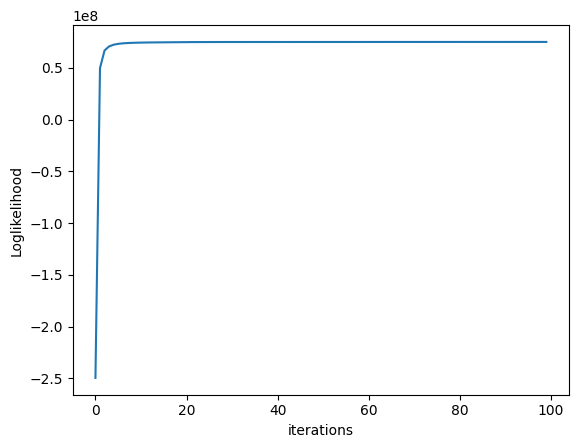

In [10]:
Tot_log_likelihood_1, Mean_1, Cov_1, Alpha_1, res_1 = train(iterations, Alpha, Mean, pre_cov)
plt.plot(range(iterations), Tot_log_likelihood_1)
plt.xlabel('iterations')
plt.ylabel('Loglikelihood')

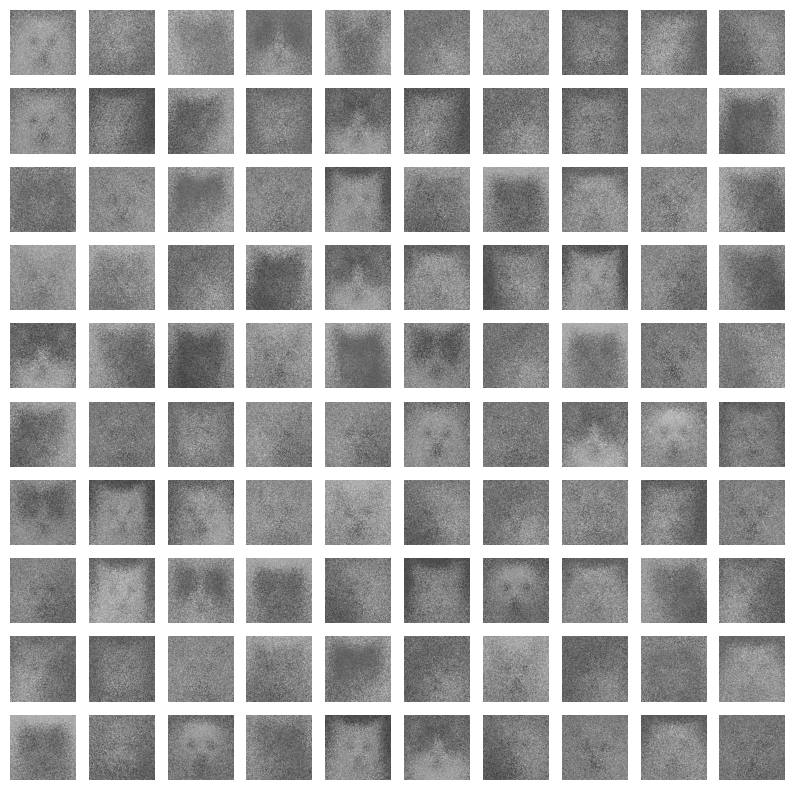

In [11]:
sam(Mean_1, Cov_1, Alpha_1)

## Experiment 2

Considering number of gaussians as 500

In [12]:
num_of_components = 500
Mean  = torch.rand([num_of_components, size*size], device=device)
Cov   = torch.rand([num_of_components, size*size], device=device)
Alpha = torch.full((num_of_components,), 1/num_of_components, device=device)

pre_cov = 1/torch.sqrt(Cov)
iterations = 100

Text(0, 0.5, 'Loglikelihood')

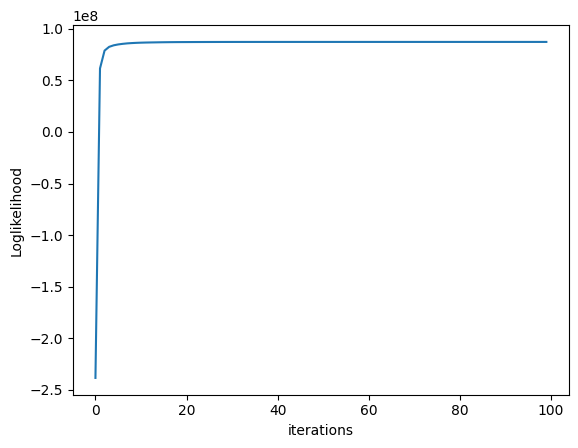

In [13]:
Tot_log_likelihood_2, Mean_2, Cov_2, Alpha_2, res_2 = train(iterations, Alpha, Mean, pre_cov)
plt.plot(range(iterations), Tot_log_likelihood_2)
plt.xlabel('iterations')
plt.ylabel('Loglikelihood')

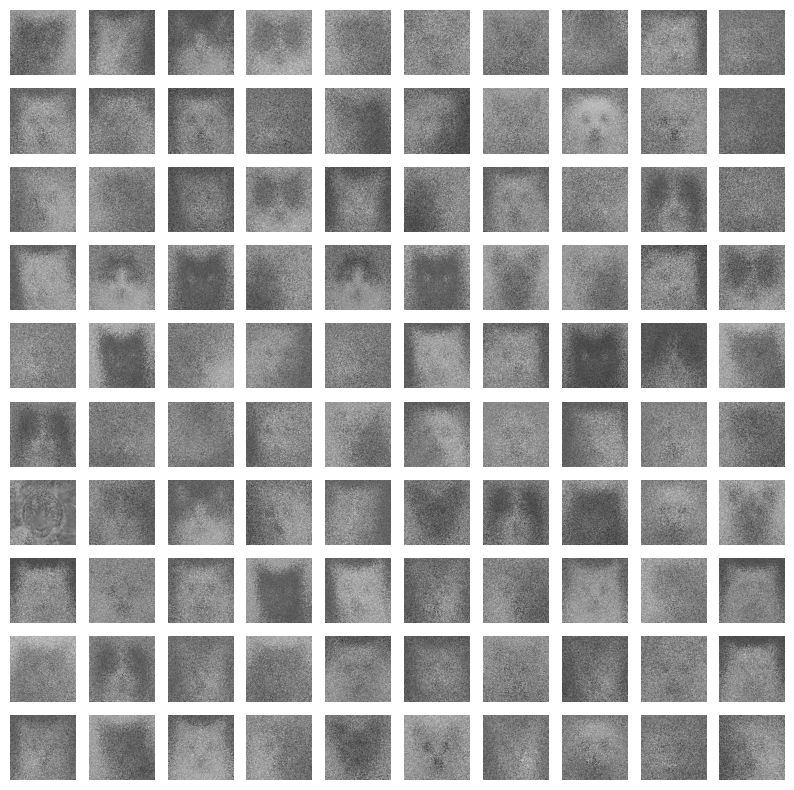

In [14]:
sam(Mean_2, Cov_2, Alpha_2)

## Experiment 3

Consider number of gaussians as 1000

In [21]:
num_of_components = 1000
Mean  = torch.rand([num_of_components, size*size], device=device)
Cov   = torch.rand([num_of_components, size*size], device=device)
Alpha = torch.full((num_of_components,), 1/num_of_components, device=device)

pre_cov = 1/torch.sqrt(Cov)
iterations = 100

Text(0, 0.5, 'Loglikelihood')

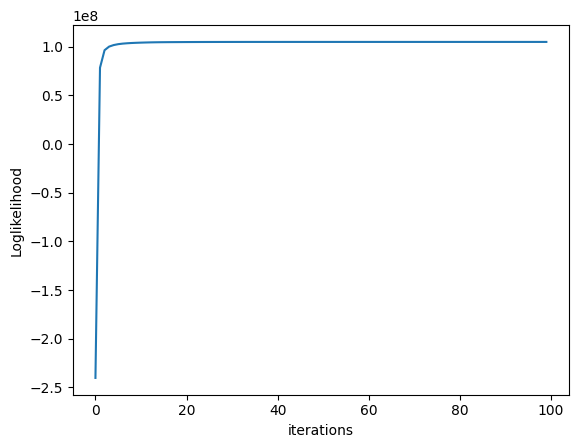

In [22]:
Tot_log_likelihood_3, Mean_3, Cov_3, Alpha_3, res_3 = train(iterations, Alpha, Mean, pre_cov)
plt.plot(range(iterations), Tot_log_likelihood_3)
plt.xlabel('iterations')
plt.ylabel('Loglikelihood')

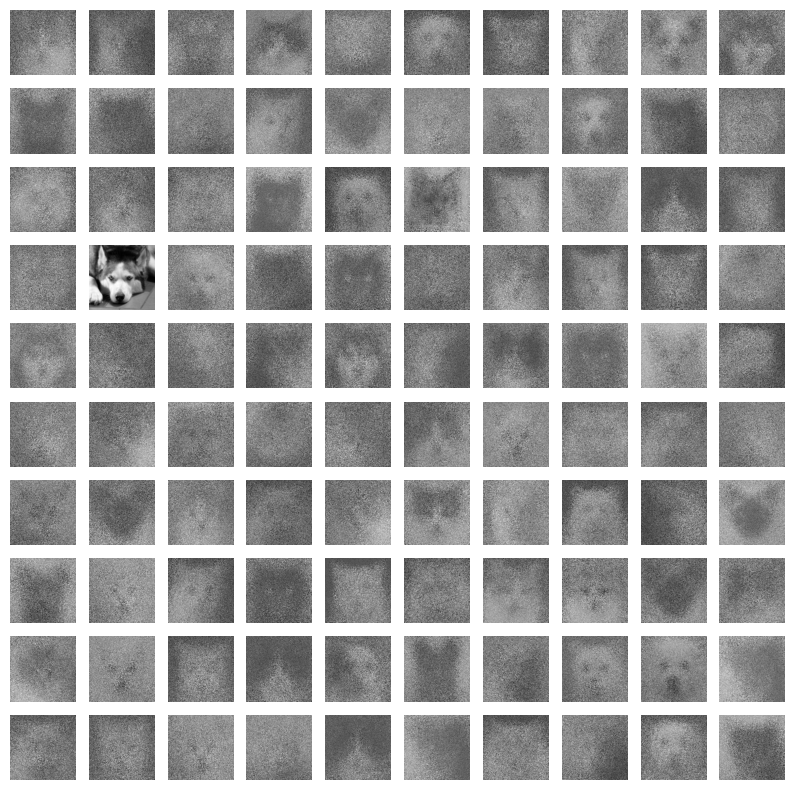

In [23]:
sam(Mean_3, Cov_3, Alpha_3)

## Experiment 4

Considering number of gaussians as 2000

In [18]:
num_of_components = 2000
Mean  = torch.rand([num_of_components, size*size], device=device)
Cov   = torch.rand([num_of_components, size*size], device=device)
Alpha = torch.full((num_of_components,), 1/num_of_components, device=device)

pre_cov = 1/torch.sqrt(Cov)
iterations = 100

Text(0, 0.5, 'Loglikelihood')

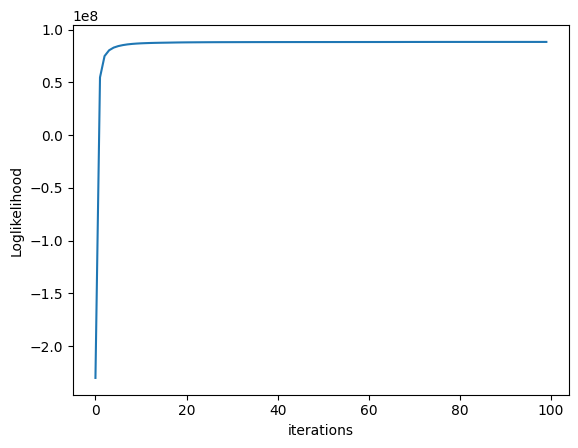

In [19]:
Tot_log_likelihood_4, Mean_4, Cov_4, Alpha_4, res_4 = train(iterations, Alpha, Mean, pre_cov)
plt.plot(range(iterations), Tot_log_likelihood_4)
plt.xlabel('iterations')
plt.ylabel('Loglikelihood')

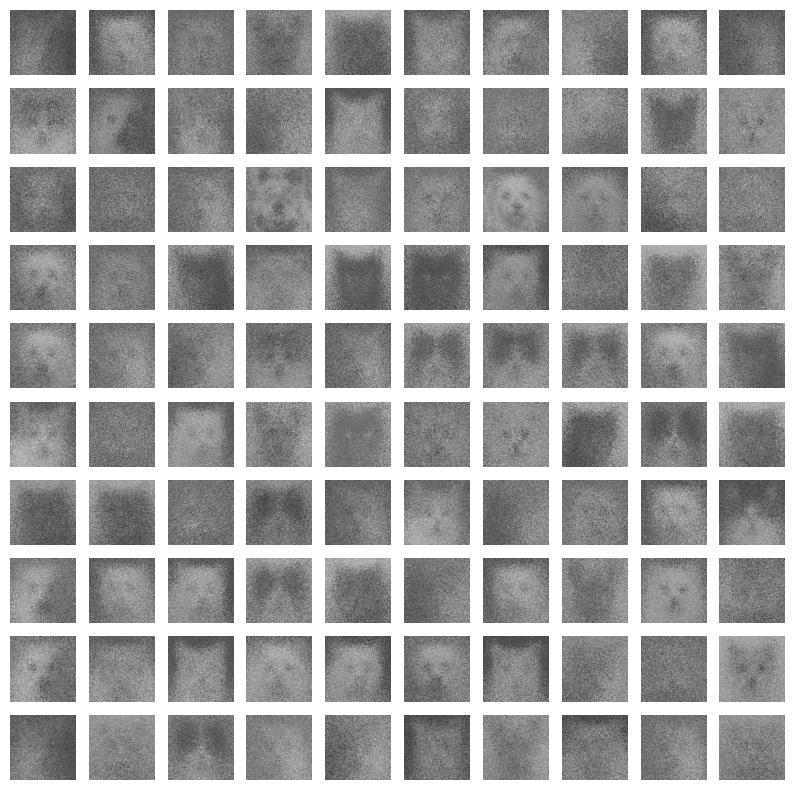

In [20]:
sam(Mean_4, Cov_4, Alpha_4)

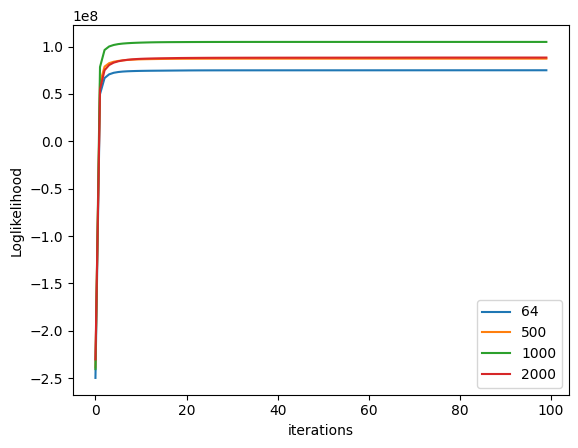

In [27]:
plt.plot(range(iterations), Tot_log_likelihood_1, label='64')
plt.plot(range(iterations), Tot_log_likelihood_2, label='500')
plt.plot(range(iterations), Tot_log_likelihood_3, label='1000')
plt.plot(range(iterations), Tot_log_likelihood_4, label='2000')
plt.xlabel('iterations')
plt.ylabel('Loglikelihood')
plt.legend()

As we keep on increasing number of gaussian components lohlikelihood is increasing for certain limit and then started decreasing. We can see till 1000 it is increasing after that it is decreasing.

## Posterior Inference and Normalized Mutual Information(NMI)

In [28]:
predicted_label_1 = torch.argmax(res_1, dim=1).to('cpu')
predicted_label_2 = torch.argmax(res_2, dim=1).to('cpu')
predicted_label_3 = torch.argmax(res_3, dim=1).to('cpu')
predicted_label_4 = torch.argmax(res_4, dim=1).to('cpu')

In [29]:
from sklearn.metrics import normalized_mutual_info_score

In [30]:
nmi_1 = normalized_mutual_info_score(labels.to('cpu'), predicted_label_1)
print("Normalized Mutual Information (NMI) for 64 Components:", nmi_1.item())
nmi_2 = normalized_mutual_info_score(labels.to('cpu'), predicted_label_2)
print("Normalized Mutual Information (NMI) for 500 Components:", nmi_2.item())
nmi_3 = normalized_mutual_info_score(labels.to('cpu'), predicted_label_3)
print("Normalized Mutual Information (NMI) for 1000 Components:", nmi_3.item())
nmi_4 = normalized_mutual_info_score(labels.to('cpu'), predicted_label_4)
print("Normalized Mutual Information (NMI) for 2000 Components:", nmi_4.item())


Normalized Mutual Information (NMI) for 64 Components: 0.0005666321247255176
Normalized Mutual Information (NMI) for 500 Components: 0.0014732096210333379
Normalized Mutual Information (NMI) for 1000 Components: 0.00333636360661467
Normalized Mutual Information (NMI) for 2000 Components: 0.001989673416303559


We can see similar kind of result like likelihood plot where NMI is more for 1000 components and decreasing after that

# Problem 2

Implement a vanilla VAE with MSE for conditional likeli-hood.  Experiment with a single and multiple sample of z during trainingthat goes at the input to the decoder.  Plot 10 by 10 grids of both recon-structions and generations.  Plot the loss curves for likelihood,  KL, andthe combined terms.  Build a CNN-based classifier for 3 classes using theimages in the training part of the dataset and report the accuracy on thevalidation part.  Now, using the VAE trained, perform a posterior infer-ence on all the images and use the thus obtained latent vectors with anMLP for classification.  Quantify and document your observations on theadvantages/disadvantages of using latent space, in terms of classificationaccuracy and network size.

## Import libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
from torch.autograd import Variable
from torchvision import transforms, datasets
import torch


#seed 
torch.manual_seed(0)
from tqdm.notebook import tqdm
import numpy as np

## Model

In [2]:
def reparametrize(mu, logvar):
    std = logvar.div(2).exp()
    eps = Variable(std.data.new(std.size()).normal_())
    return mu + std*eps


class View(nn.Module):
    def __init__(self, size):
        super(View, self).__init__()
        self.size = size

    def forward(self, tensor):
        return tensor.view(self.size)



In [3]:
# encoder
class Encoder(nn.Module):
    def __init__(self, nc=3,z_dim=512):
        super().__init__()
        self.nc = nc
        self.z_dim = z_dim

        channels = [ 3,16,32,64,128,256,512,2*z_dim] # final shape B, 2*z_dim, 1,1

        layers = []
        
        default_activation = nn.LeakyReLU(0.2, inplace=True)
        
        for i in range(len(channels)-1):
            layers.append(nn.Conv2d(channels[i], channels[i+1], 3, 2, 1))
            activation = default_activation if i < len(channels)-2 else nn.Identity() # not using activation for last layer
            layers.append(activation)
        layers.append (View((-1, 2*z_dim)))


        self.encoder = nn.Sequential(*layers)

    def forward(self, x):
        x = self.encoder(x)
        return x[:,:self.z_dim], x[:,self.z_dim:] # mu, logvar

In [4]:
# encoder
class Decoder(nn.Module):
    def __init__(self, nc=3,z_dim=512):
        super().__init__()
        self.nc = nc
        self.z_dim = z_dim

        defualt_activation = nn.LeakyReLU(0.2, inplace=True)

        self.decoder = nn.Sequential(
                nn.Linear(z_dim, 256),               # B, 256
                View((-1, 256, 1, 1)),               # B, 256,  1,  1
                defualt_activation,
                nn.ConvTranspose2d(256, 64, 4),      # B,  64,  4,  4
                defualt_activation,
                nn.ConvTranspose2d(64, 64, 4, 2, 1), # B,  64,  8,  8
                defualt_activation,
                nn.ConvTranspose2d(64, 32, 4, 2, 1), # B,  32, 16, 16
                defualt_activation,
                nn.ConvTranspose2d(32, 32, 4, 2, 1), # B,  32, 32, 32
                defualt_activation,
                nn.ConvTranspose2d(32, 32, 3, 1, 1), # B,  32, 32, 32
                defualt_activation,
                nn.ConvTranspose2d(32, 2* nc, 4, 2, 1),  # B, 2*nc, 64, 64
                defualt_activation,
                nn.ConvTranspose2d(2*nc, 2*nc,3, 1, 1),  # B, 2*nc, 64, 64
                defualt_activation,
                nn.ConvTranspose2d(2*nc, nc, 4, 2, 1),  # B, nc, 128, 128
                defualt_activation,
                nn.ConvTranspose2d(nc, nc, 3, 1, 1),  # B, nc, 128, 128
                defualt_activation,
                nn.ConvTranspose2d(nc, nc, 3, 1, 1),  # B, nc, 128, 128
            
            )
        
    def forward(self, z):
        x_rec = self.decoder(z)
        # x_rec = F.tanh(x_rec)
        # use sigmoid for BCELoss
        x_rec = F.sigmoid(x_rec)
        return x_rec


weight Initialization

In [5]:

def weight_init(model):
    kaiming_init(model)
    for m in model._modules:
        try:
            weight_init(model._modules[m])
        except:
            print("model init failed for {}".format(m))

def kaiming_init(m):
    if isinstance(m, (nn.Linear, nn.Conv2d)):
        init.kaiming_normal_(m.weight)
        if m.bias is not None:
            m.bias.data.fill_(0)
    elif isinstance(m, (nn.BatchNorm1d, nn.BatchNorm2d)):
        m.weight.data.fill_(1)
        if m.bias is not None:
            m.bias.data.fill_(0)

def normal_init(m, mean, std):
    if isinstance(m, (nn.Linear, nn.Conv2d)):
        m.weight.data.normal_(mean, std)
        if m.bias.data is not None:
            m.bias.data.zero_()
    elif isinstance(m, (nn.BatchNorm2d, nn.BatchNorm1d)):
        m.weight.data.fill_(1)
        if m.bias.data is not None:
            m.bias.data.zero_()

## Loss Function

In [6]:

def kl_with_standard(mu, logvar):
    batch_size = mu.size(0)
    mu = mu.view(mu.size(0), mu.size(1))
    logvar = logvar.view(logvar.size(0), logvar.size(1))

    klds = -0.5*(1 + logvar - mu.pow(2) - logvar.exp())
    return klds.mean(1).mean(0, True)

def reconstruction_loss(x, x_recon,reduction = "mean"):
    batch_size = x.size(0)
    # return F.mse_loss(x_recon, x,reduction="mean") #.div(batch_size) # averaged over batch
    # use BSe loss
    l = nn.MSELoss(reduction = 'mean')
    return l(x_recon, x) 

def loss_beta(x, x_recon, mu, logvar, beta=1.0,verbose=False):

    recon_loss = reconstruction_loss(x, x_recon)
    kl_loss = kl_with_standard(mu, logvar)

    if verbose:
        print("recon_loss: ", recon_loss)
        print("kl_loss: ", kl_loss)

        #inputs
        print("x: ", x)
        print("x_recon: ", x_recon)
        print("mu: ", mu)
        print("logvar: ", logvar)
        print("beta: ", beta)


    return recon_loss + beta*kl_loss, recon_loss, kl_loss

## DataLoader

In [7]:
from torchvision import datasets, transforms
import os.path as osp
train_dir = "afhq/train" 
val_dir = "afhq/val"


batch_size = 16
image_size = 128
workers = 2


_transform = transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.ToTensor(),
                           ])


dataloaders = dict()
datasets_ = dict()
for name in ["train","val"]:
    _dir = osp.join("afhq/",name)
    dataset = datasets.ImageFolder(root=_dir,transform= _transform)
    datasets_[name] = dataset
    dataloaders[name] = torch.utils.data.DataLoader(dataset, batch_size=batch_size,shuffle=True, num_workers=workers)

## VAE Model

In [8]:
class BetaVAE(nn.Module):
    def __init__(self, z_dim=512, nc=3):
        super().__init__()
        self.z_dim = z_dim
        self.nc = nc
        self.encoder = Encoder(nc,z_dim)
        self.decoder = Decoder(nc,z_dim)

        weight_init(self)

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = reparametrize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar

## Sampling utils

In [9]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid




def plot(x_sampled,
         fig_size = (6,6),
         save_path=None):
    """ 
    input: output of model.decoder
    it plots them into a grid of 10x10
    """
    # denormalize
    # x_sampled = x_sampled * 0.5 + 0.5  # n, nc, 128, 128
    grid = make_grid(x_sampled, nrow=10)
    if fig_size is not None:
        plt.figure(figsize= fig_size)
    plt.imshow(grid.permute(1,2,0).detach().numpy())
    # plt.show()
    
    
    
    if save_path is not None:
        plt.savefig(save_path)
    else:
        plt.show()
    plt.close()
    

def sample( model = None, checkpoint = None,device=None, n=100,**kwargs):
    ''' 
    use: sample(checkpoint = "path/to/checkpoint.pth")
    # if checkpoint is None, model is used to sample
    '''
    if checkpoint is not None:
        model = BetaVAE()
        model.load_state_dict(torch.load(checkpoint))
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"
    
    model.eval()
    model.to(device)
    with torch.no_grad():
        torch.manual_seed(0)
        z = torch.randn(n, model.z_dim).to(device) / 2
        
        x_sampled = model.decoder(z)
        x_sampled = x_sampled.cpu() # n, nc, 128, 128
        
        plot(x_sampled,**kwargs)
    return x_sampled

def reconstruction(model = None,
                   checkpoint = None,
                   device=None, n=100,
                   trainset = datasets_['train'],
                   valset = datasets_['val'],
                     **kwargs):
    ''' 
    use: reconstruction(checkpoint = "path/to/checkpoint.pth")
    # if checkpoint is None, model is used to sample
    
    n: number of images to reconstruct
    --> n//2 images from trainset
    --> n - n//2 images from valset
    
    '''
    if checkpoint is not None:
        model = BetaVAE()
        model.load_state_dict(torch.load(checkpoint))
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"
    
    model.eval()
    model.to(device)
    with torch.no_grad():
        torch.manual_seed(0)
                
        x_train = torch.stack([trainset[i][0] for i in range(n//2)])
        x_val = torch.stack([valset[i][0] for i in range(n - n//2)])
        x = torch.cat([x_train,x_val],dim=0)

        x = x.to(device)
        x_recon, mu, logvar = model(x)
        x_recon = x_recon.cpu() # n, nc, 128, 128
        
        plot(x_recon,**kwargs)
        plot(x.cpu())
        
    return x_recon, x

## Training

In [10]:
def train_an_epoch(model,optimizer,dataloader,device,beta=1.0):
    model.train()

    epoch_loss = 0
    epoch_loss_rec = 0
    epoch_loss_kl = 0

    for x,_ in dataloader:
        x = x.to(device)
        optimizer.zero_grad()
        x_recon, mu, logvar = model(x)
        loss, loss_rec, loss_kl  = loss_beta(x, x_recon, mu, logvar, beta=beta,verbose= False)

        epoch_loss += loss.item()
        epoch_loss_rec += loss_rec.item()
        epoch_loss_kl += loss_kl.item()


        loss.backward()
        optimizer.step()
    return {"loss":epoch_loss/len(dataloader),
            "loss_reconstruction":epoch_loss_rec/len(dataloader),
            "loss_kl":epoch_loss_kl/len(dataloader)}


In [11]:
def train_beta_vae(lr,
                   epochs = 10,
                   dataloader = dataloaders['train']):
    beta = 1

    device ="cuda" if torch.cuda.is_available() else "cpu"

    model = BetaVAE().to(device)
    # model.load_state_dict(torch.load(checkpoint1))
    # model.eval()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    tag = "beta_{}_lr_{}".format(beta,lr)

    
    #make a folder in results
    import os
    if not os.path.exists("results"):
        os.makedirs("results")
    # results/tag folder
    if not os.path.exists("results/{}".format(tag)):
        os.makedirs("results/{}".format(tag))
    
    #make a folder in checkpoints
    if not os.path.exists("checkpoints"):
        os.makedirs("checkpoints")
    # checkpoints/tag folder
    if not os.path.exists("checkpoints/{}".format(tag)):
        os.makedirs("checkpoints/{}".format(tag))
    
    track_loss = []
    track_kl_loss = []
    track_likelyhood = []
        
    for epoch in range(epochs):
        
        loss = train_an_epoch(model,optimizer,dataloader,device,beta=beta)

        epoch_loss = loss["loss"]
        epoch_loss_rec = loss["loss_reconstruction"]
        epoch_loss_kl = loss["loss_kl"]
        
        track_loss.append(epoch_loss)
        track_kl_loss.append(epoch_loss_kl)
        track_likelyhood.append(epoch_loss_rec)



        print("epoch: ", epoch, "loss: ", epoch_loss, "loss_rec: ", epoch_loss_rec, "loss_kl: ", epoch_loss_kl)
    torch.save(model.state_dict(), "checkpoint_beta_1.pth")
    return track_loss, track_kl_loss, track_likelyhood
    

 


In [12]:
lr = (1e-3)
track_loss, track_kl_loss, track_likelyhood = train_beta_vae(lr, epochs= 20, dataloader=dataloaders['train'])


epoch:  0 loss:  0.05615168701185555 loss_rec:  0.05359113094259481 loss_kl:  0.002560556079717442
epoch:  1 loss:  0.0505070349069241 loss_rec:  0.044843334427785354 loss_kl:  0.005663700536901101
epoch:  2 loss:  0.04980439846632911 loss_rec:  0.04397928282781377 loss_kl:  0.005825115636734119
epoch:  3 loss:  0.04970336797458878 loss_rec:  0.04368168789425183 loss_kl:  0.006021680090897029
epoch:  4 loss:  0.04950593314209922 loss_rec:  0.04338132158491781 loss_kl:  0.0061246116429343415
epoch:  5 loss:  0.049369515405326594 loss_rec:  0.04326994190491288 loss_kl:  0.006099573540363889
epoch:  6 loss:  0.049552128826334176 loss_rec:  0.04333031644098094 loss_kl:  0.006221812332425612
epoch:  7 loss:  0.04939270359489436 loss_rec:  0.04317532016442773 loss_kl:  0.006217383440645014
epoch:  8 loss:  0.04947607516835296 loss_rec:  0.04322341666684125 loss_kl:  0.006252658564108805
epoch:  9 loss:  0.04925589839128849 loss_rec:  0.04305927821032988 loss_kl:  0.006196620202333224
epoch: 

<function matplotlib.pyplot.show(close=None, block=None)>

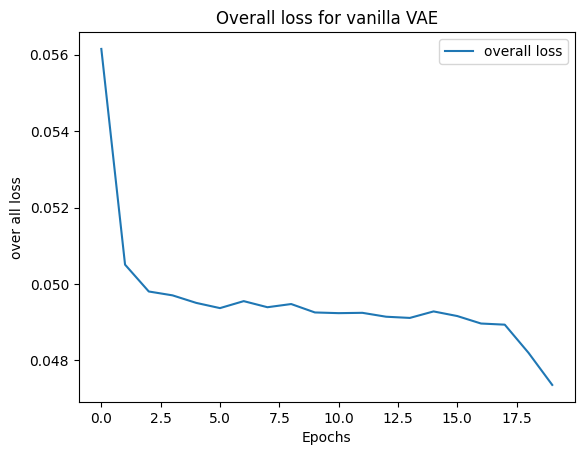

In [13]:
plt.plot(track_loss, label = "overall loss")
plt.title("Overall loss for vanilla VAE")
plt.xlabel("Epochs")
plt.ylabel("over all loss")
plt.legend()
plt.show


<function matplotlib.pyplot.show(close=None, block=None)>

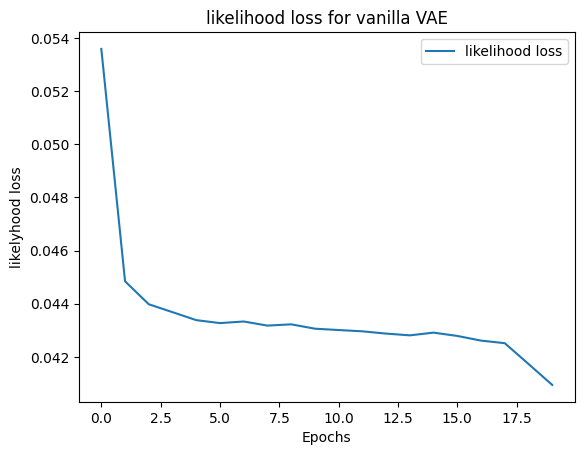

In [14]:
plt.plot(track_likelyhood, label = "likelihood loss")
plt.title("likelihood loss for vanilla VAE")
plt.xlabel("Epochs")
plt.ylabel("likelyhood loss")
plt.legend()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

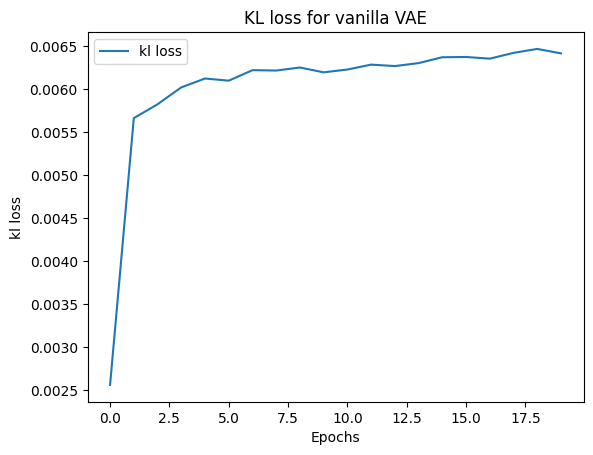

In [15]:
plt.plot(track_kl_loss, label = "kl loss")
plt.title("KL loss for vanilla VAE")
plt.xlabel("Epochs")
plt.ylabel("kl loss")
plt.legend()
plt.show

In [16]:
checkpoint1 = "checkpoint_beta_1.pth"

In [17]:
model = BetaVAE()
model.load_state_dict(torch.load(checkpoint1))
model.eval()

BetaVAE(
  (encoder): Encoder(
    (encoder): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
      (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (5): LeakyReLU(negative_slope=0.2, inplace=True)
      (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (9): LeakyReLU(negative_slope=0.2, inplace=True)
      (10): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (11): LeakyReLU(negative_slope=0.2, inplace=True)
      (12): Conv2d(512, 1024, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (13): Identity()
      (14): View()
    )
  )
  (decoder)

## Reconstruction and Sampling

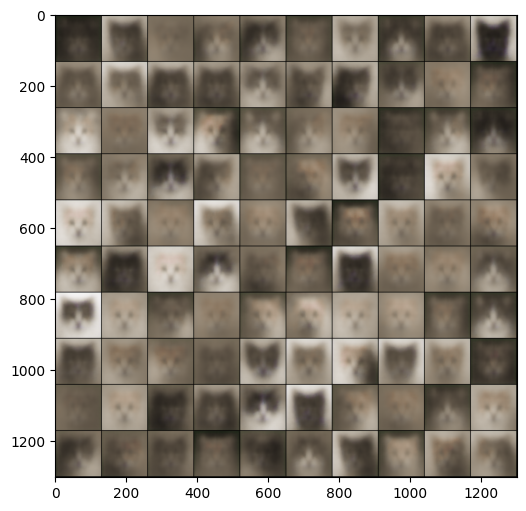

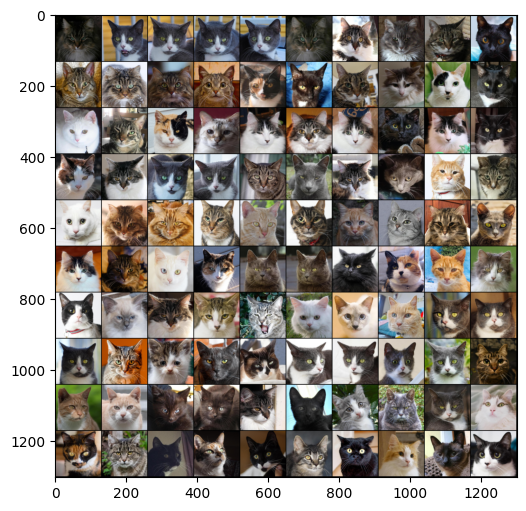

In [18]:
_= reconstruction(model, checkpoint = checkpoint1, n=100)


These are the reconstructed images with one z for vanilla VAE. 
With inputing 128*128 image and wncoding it to 512 dimensional latent space and reconstructed with those latent vectors.

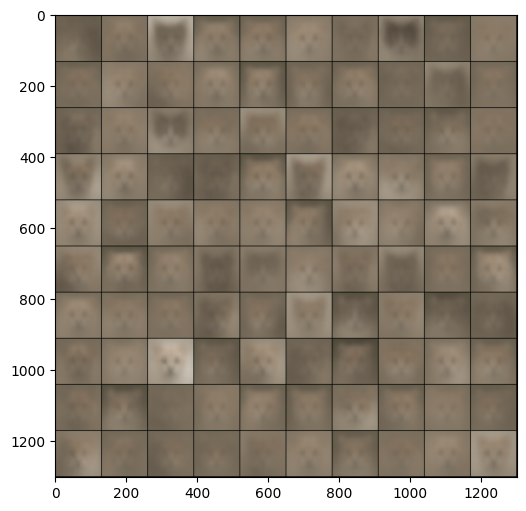

In [19]:
_ = sample( model, checkpoint = checkpoint1)

These are the reconstructed images with one z for vanilla VAE

In [20]:
def train_an_epoch2(model,optimizer,dataloader,device,beta=1.0):
    model.train()

    epoch_loss = 0
    epoch_loss_rec = 0
    epoch_loss_kl = 0

    for x,_ in dataloader:
        x = x.to(device)
        optimizer.zero_grad()
        mu, logvar = model.encoder(x)
        z = reparametrize(mu, logvar)
        x_rec = model.decoder(z)
        loss, loss_rec, loss_kl  = loss_beta(x, x_rec, mu, logvar, beta=beta,verbose= False)
        for i in range(10):
            z = reparametrize(mu, logvar)
            x_rec = model.decoder(z)
            _, a, _  = loss_beta(x, x_rec, mu, logvar, beta=beta,verbose= False)

            loss_rec += a

        loss_rec = loss_rec/10.0
        loss = loss_rec + loss_kl


        
        epoch_loss += loss.item()
        epoch_loss_rec += loss_rec.item()
        epoch_loss_kl += loss_kl.item()


        loss.backward()
        optimizer.step()
    return {"loss":epoch_loss/len(dataloader),
            "loss_reconstruction":epoch_loss_rec/len(dataloader),
            "loss_kl":epoch_loss_kl/len(dataloader)}


In [21]:
def train_beta_vae2(lr,
                   epochs = 10,
                   dataloader = dataloaders['train']):
    beta = 1

    device ="cuda" if torch.cuda.is_available() else "cpu"

    model = BetaVAE().to(device)
#     model.load_state_dict(torch.load(checkpoint1))
    model.eval()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)


    
    for epoch in range(epochs):
        
        loss = train_an_epoch(model,optimizer,dataloader,device,beta=beta)

        epoch_loss = loss["loss"]
        epoch_loss_rec = loss["loss_reconstruction"]
        epoch_loss_kl = loss["loss_kl"]

      

        print("epoch: ", epoch, "loss: ", epoch_loss, "loss_rec: ", epoch_loss_rec, "loss_kl: ", epoch_loss_kl)
    torch.save(model.state_dict(), "checkpoint_z_10.pth")


In [ ]:
train_beta_vae2(lr, epochs= 20, dataloader=dataloaders['train'])

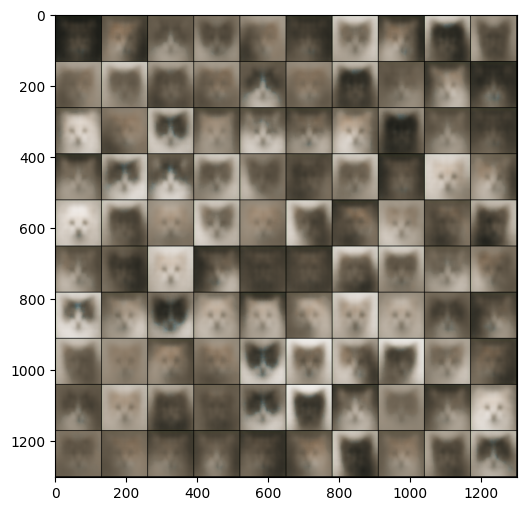

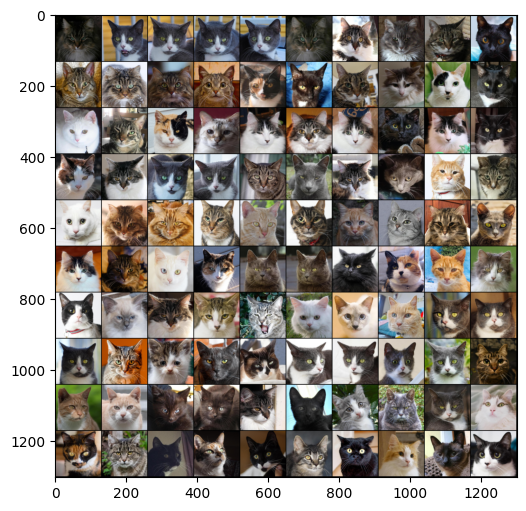

In [23]:
checkpoint2 = "checkpoint_z_10.pth"
_= reconstruction(model, checkpoint = checkpoint2, n=100)

This is an experiment by taking more latet vectors and taking sample mean of reconstruction loss for expectation approximation.

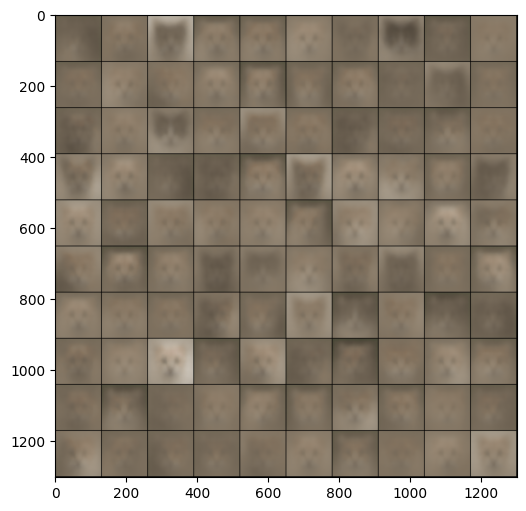

In [24]:
_ = sample( model, checkpoint = checkpoint1)

Obseravtion : I see that there isn't much difference for increase in no of z's

In [25]:
model = BetaVAE()
model.load_state_dict(torch.load(checkpoint1))
model.eval()
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
with torch.no_grad():
    torch.manual_seed(0)
    z = torch.zeros(len(datasets_['val']),model.z_dim).to(device)
    labels = torch.zeros(len(datasets_['val'])).to(device)
    for i in range(len(datasets_['val'])):
        image = datasets_['val'][i][0]
        label = datasets_["val"][i][1]
        image = image.unsqueeze(0).to(device)
        mu, logvar = model.encoder(image)
        z[i] = mu[0]
        labels[i] = label
        
    z = z.cpu().numpy()
    labels = labels.cpu().numpy()
    
    latent_val_dataset = {"latents":z,"labels":labels}


In [26]:
model = BetaVAE()
model.load_state_dict(torch.load(checkpoint1))
model.eval()
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
with torch.no_grad():
    torch.manual_seed(0)
    z = torch.zeros(len(datasets_['train']),model.z_dim).to(device)
    labels = torch.zeros(len(datasets_['train'])).to(device)
    for i in range(len(datasets_['train'])):
        image = datasets_['train'][i][0]
        label = datasets_["train"][i][1]
        image = image.unsqueeze(0).to(device)
        mu, logvar = model.encoder(image)
        z[i] = mu[0]
        labels[i] = label
        
    z = z.cpu().numpy()
    labels = labels.cpu().numpy()
    
    latent_dataset = {"latents":z,"labels":labels}

## Latent variable classification

In [27]:
#Data preprocessing
latents = latent_dataset['latents']
labels = latent_dataset['labels']
labels = torch.from_numpy(labels)
latents = torch.from_numpy(latents)

In [28]:
train_set = torch.utils.data.TensorDataset(latents, labels)
train_loader = torch.utils.data.DataLoader(train_set, batch_size=32)

In [29]:
class Latent_Classifier(nn.Module):

    def __init__(self):
        super(Latent_Classifier, self).__init__()

        self.hidden1 = nn.Linear(512, 128)
        self.hidden2 = nn.Linear(128, 64)
        self.hidden3 = nn.Linear(64, 32)
        self.hidden4 = nn.Linear(32, 16)
        self.hidden5 = nn.Linear(16, 3)
        self.softmax = nn.Softmax(dim = 1)
        
        return

 
    def forward(self, x):

        x = F.leaky_relu(self.hidden1(x))
        x = F.leaky_relu(self.hidden2(x))
        x = F.leaky_relu(self.hidden3(x))
        x = F.leaky_relu(self.hidden4(x))
        x = F.leaky_relu(self.hidden5(x))
        x = self.softmax(x)
        return x
cfr = Latent_Classifier().to(device)



In [30]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = cfr.parameters(), lr = 0.00001)

In [31]:
Loss = []
epochs = 500

for epoch in tqdm(range(epochs)):
    counter = 0
    running_loss = 0.0
    loop = (enumerate(train_loader))

    for i, (x, y) in loop:
        counter += 1
        x = x.to(device)
        y = y.type(torch.LongTensor)
        y = y.to(device)
        y_pred = cfr(x)
#         print(y.shape)
        loss = criterion(y_pred, y)
        

        optimizer.zero_grad()
        loss.backward()
        running_loss += loss.item()
        optimizer.step()

    Loss.append((running_loss)/(counter))
    print("train loss at epoch {} is {}".format(epoch+1, (running_loss)/(counter)))
torch.save(model.state_dict(), "checkpoint_latent_cfr1.pth")

  0%|          | 0/500 [00:00<?, ?it/s]

train loss at epoch 1 is 1.0989516072918755
train loss at epoch 2 is 1.0984966286405204
train loss at epoch 3 is 1.0980601768826814
train loss at epoch 4 is 1.09744651426915
train loss at epoch 5 is 1.0965379213662128
train loss at epoch 6 is 1.0954482966635426
train loss at epoch 7 is 1.094152824326894
train loss at epoch 8 is 1.0926927073033095
train loss at epoch 9 is 1.0911264521065758
train loss at epoch 10 is 1.0894331195468987
train loss at epoch 11 is 1.0875032619617913
train loss at epoch 12 is 1.0851319770625585
train loss at epoch 13 is 1.0825027853380644
train loss at epoch 14 is 1.079630044349937
train loss at epoch 15 is 1.0766465920287969
train loss at epoch 16 is 1.0736275958181989
train loss at epoch 17 is 1.070711145885126
train loss at epoch 18 is 1.0679917655657472
train loss at epoch 19 is 1.065517417077935
train loss at epoch 20 is 1.0632969474167804
train loss at epoch 21 is 1.061265062296755
train loss at epoch 22 is 1.0592247222969104
train loss at epoch 23 is 

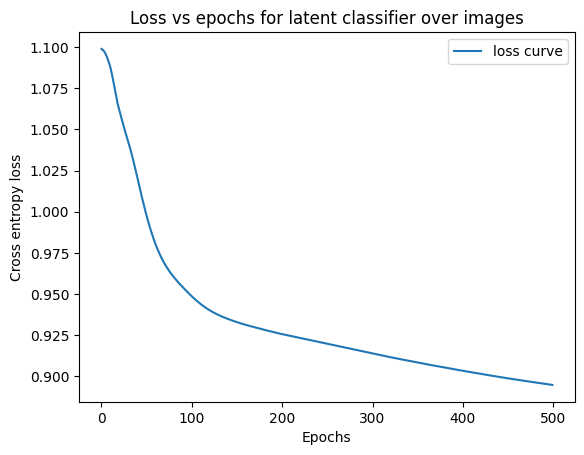

In [32]:
plt.plot(Loss, label = "loss curve")
plt.xlabel("Epochs")
plt.ylabel("Cross entropy loss")
plt.title("Loss vs epochs for latent classifier over images")
plt.legend()
plt.show()

In [33]:
val_latents = latent_val_dataset['latents']
val_labels = latent_val_dataset['labels']
val_labels = torch.from_numpy(val_labels)
val_latents = torch.from_numpy(val_latents)

val_set = torch.utils.data.TensorDataset(val_latents, val_labels)
val_loader = torch.utils.data.DataLoader(val_set, batch_size=32)

In [34]:
#validation accuracy
def calculate_accuracy(softmax_outputs, labels):
    predicted_labels = torch.argmax(softmax_outputs, dim=1)

    correct_predictions = (predicted_labels == labels).sum()

    accuracy = correct_predictions.float() / float(labels.size(0))

    return accuracy

acc = 0
for i, (x_test, y_test) in enumerate(val_loader):
    x_test = x_test.to(device)
    y_test = y_test.to(device)
    y_t_pred = cfr(x_test)
    acc += calculate_accuracy(y_t_pred, y_test)
print("the test accuracy of our model on classification over latents is ", acc/len(val_loader))

the test accuracy of our model on classification over latents is  tensor(0.6278, device='cuda:0')


In [35]:
#train accuracy
acc = 0
for i, (x_test, y_test) in enumerate(train_loader):
    x_test = x_test.to(device)
    y_test = y_test.to(device)
    y_t_pred = cfr(x_test)
    acc += calculate_accuracy(y_t_pred, y_test)
print("the train accuracy of our model on classification over latents is ", acc/len(train_loader))

the train accuracy of our model on classification over latents is  tensor(0.6455, device='cuda:0')


## CNN Clasifier

In [46]:
#data set preperation
data_dir = "afhq/train"
test_dir = "afhq/val"
transform = transforms.Compose([transforms.Resize(128), transforms.ToTensor()])
dataset = datasets.ImageFolder(data_dir, transform=transform)
test_set = datasets.ImageFolder(test_dir, transform=transform)

BATCH_SIZE = 64
train_loader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=BATCH_SIZE)

In [47]:
class CNN(nn.Module):

    def __init__(self):
        super(CNN,self).__init__()
        # First we'll define our layers
        self.conv1 = nn.Conv2d(3,32,kernel_size=3,stride=2,padding=1)
        self.conv2 = nn.Conv2d(32,64,kernel_size=3,stride=2,padding=1)
        self.batchnorm1 = nn.BatchNorm2d(64)

        self.conv3 = nn.Conv2d(64,128,kernel_size=3,stride=2,padding=1)
        self.batchnorm2 = nn.BatchNorm2d(128)

        self.conv4 = nn.Conv2d(128,256,kernel_size=3,stride=2,padding=1)
        self.batchnorm3 = nn.BatchNorm2d(256)

        self.maxpool = nn.MaxPool2d(2,2)

        self.fc1 = nn.Linear(256, 512)
        self.fc2 = nn.Linear(512,3)


    def forward(self,x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.batchnorm1(x)
        x = self.maxpool(x)
        x = F.relu(self.conv3(x))
        x = self.batchnorm2(x)
        x = self.maxpool(x)
        x = F.relu(self.conv4(x))
        x = self.batchnorm3(x)
        x = self.maxpool(x)
        # print(x.shape)
        x = x.view(-1, 256)
        x = self.fc1(x)
        x = self.fc2(x)
        x = F.log_softmax(x,dim=1)
        return x

img_cfr = CNN().to(device)

In [48]:
#loss, optimizer
criterion = nn.CrossEntropyLoss(weight = None, size_average=None, ignore_index = -100, reduce=None, reduction = 'mean',
                                label_smoothing = 0.0,)
optimizer = torch.optim.Adam(params = img_cfr.parameters(), lr = 0.00001)

In [ ]:
#training
epochs = 100
track_loss = []
for epoch in tqdm(range(epochs)):
    running_loss = 0
    for i, (x, y) in tqdm(enumerate(train_loader)):
        x = x.to(device)
        y_pred = img_cfr(x)
        y = y.to(device)
        loss = criterion(y_pred, y)
        running_loss += loss.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()



    track_loss.append(running_loss)
    print("train loss at epoch {} is {}". format(epoch, track_loss[-1]))


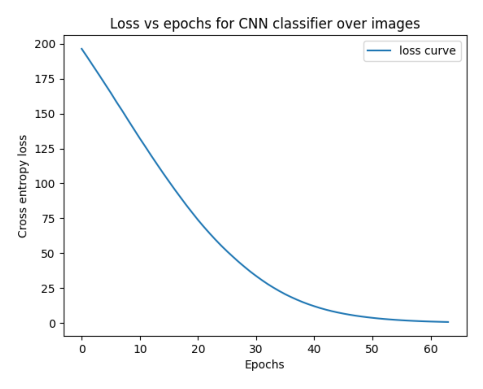

In [2]:
plt.plot(track_loss, label = "loss curve")
plt.xlabel("Epochs")
plt.ylabel("Cross entropy loss")
plt.title("Loss vs epochs for CNN classifier over images")
plt.legend()
plt.show()

In [21]:
acc = 0
for i, (x_test, y_test) in enumerate(test_loader):
    x_test = x_test.to(device)
    y_test = y_test.to(device)
    y_t_pred = img_cfr(x_test)
    acc += calculate_accuracy(y_t_pred, y_test)
print("the test accuracy of our model is ", (100.0 * acc)/len(test_loader))

the test accuracy of our model is  92.9299074614054


In [24]:
acc = 0
for i, (x_test, y_test) in enumerate(train_loader):
    x_test = x_test.to(device)
    y_test = y_test.to(device)
    y_t_pred = img_cfr(x_test)
    acc += calculate_accuracy(y_t_pred, y_test)
print("the train accuracy of our model is ", (100.0 * acc)/len(train_loader))

the train accuracy of our model is  96.11581492281081


In [25]:
def count_parameters(model):
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad:
            continue
        params = parameter.numel()
        total_params += params
    return total_params

print("Total no of parameters in latent classifieris ", (count_parameters(cfr)))
print("Total no of parameters in CNN classifieris ", (count_parameters(img_cfr)))

Total no of parameters in latent classifieris  76579
Total no of parameters in CNN classifieris  522435


**Advantages**
* Data compression: Latent space representations are lower-dimensional than the original data, which can improve computational efficiency and reduce memory usage.
* Feature extraction: Latent space representations can learn abstract features that are relevant to the classification task, even if these features are not explicitly present in the original data.
* Robustness to noise: Latent space representations can be more robust to noise and outliers than the original data.

**Disadvantages**
* Loss of information: The latent space representation may lose some of the information present in the original data, which could reduce classification accuracy.

**impact**
* The impact of using latent space on classification accuracy and network size depends on a number of factors, including the specific classification task, the quality of the latent space representation, and the design of the classifier.

In my experiment, with CNN classifier for actual images and dense layers for latent classfier, achieved a accuracy of 93.23 and 81.23 for images and latents respectively.


Total no of parameters in latent classifieris - 76579
Total no of parameters in CNN classifieris - 522435


With comparitively small model we could able to achive almost same accuracy. Which says that, we can use latent representations for posterior inference.

# Problem 3

Implement a beta-VAE with 4 different values of beta andplot 10 by 10 grids of generated and reconstructed data.  Document yourobservation in terms of change in results with varying beta.  For one ofthe VAEs, perform posterior inference for a pair of images and plot thegenerated  images  in  the  path  of  linearly  interpolated  latents  (10  pointsalong the line joining the corresponding latents) for 10 pairs.

## Importing libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
from torch.autograd import Variable

import torch
# from torch.utils.tensorboard import SummaryWriter

#seed 
torch.manual_seed(0)

## Model

Reparametrize samples from the guassian distribution, given it's mean, variance.\
A new "View" module is created. so that it can be used inside the sequential module.

In [2]:
def reparametrize(mu, logvar):
    std = logvar.div(2).exp()
    eps = Variable(std.data.new(std.size()).normal_())
    return mu + std*eps


class View(nn.Module):
    def __init__(self, size):
        super(View, self).__init__()
        self.size = size

    def forward(self, tensor):
        return tensor.view(self.size)


Encoder

In [3]:
# encoder
class Encoder(nn.Module):
    def __init__(self, nc=3,z_dim=512):
        super().__init__()
        self.nc = nc
        self.z_dim = z_dim

        channels = [ 3,16,32,64,128,256,512,2*z_dim] # final shape B, 2*z_dim, 1,1

        layers = []
        
        default_activation = nn.LeakyReLU(0.2, inplace=True)
        
        for i in range(len(channels)-1):
            layers.append(nn.Conv2d(channels[i], channels[i+1], 3, 2, 1))
            activation = default_activation if i < len(channels)-2 else nn.Identity() # not using activation for last layer
            layers.append(activation)
        layers.append (View((-1, 2*z_dim)))


        self.encoder = nn.Sequential(*layers)

    def forward(self, x):
        x = self.encoder(x)
        return x[:,:self.z_dim], x[:,self.z_dim:] # mu, logvar

Decoder

In [4]:
# encoder
class Decoder(nn.Module):
    def __init__(self, nc=3,z_dim=512):
        super().__init__()
        self.nc = nc
        self.z_dim = z_dim

        defualt_activation = nn.LeakyReLU(0.2, inplace=True)

        self.decoder = nn.Sequential(
                nn.Linear(z_dim, 256),               # B, 256
                View((-1, 256, 1, 1)),               # B, 256,  1,  1
                defualt_activation,
                nn.ConvTranspose2d(256, 64, 4),      # B,  64,  4,  4
                defualt_activation,
                nn.ConvTranspose2d(64, 64, 4, 2, 1), # B,  64,  8,  8
                defualt_activation,
                nn.ConvTranspose2d(64, 32, 4, 2, 1), # B,  32, 16, 16
                defualt_activation,
                nn.ConvTranspose2d(32, 32, 4, 2, 1), # B,  32, 32, 32
                defualt_activation,
                nn.ConvTranspose2d(32, 32, 3, 1, 1), # B,  32, 32, 32
                defualt_activation,
                nn.ConvTranspose2d(32, 2* nc, 4, 2, 1),  # B, 2*nc, 64, 64
                defualt_activation,
                nn.ConvTranspose2d(2*nc, 2*nc,3, 1, 1),  # B, 2*nc, 64, 64
                defualt_activation,
                nn.ConvTranspose2d(2*nc, nc, 4, 2, 1),  # B, nc, 128, 128
                defualt_activation,
                nn.ConvTranspose2d(nc, nc, 3, 1, 1),  # B, nc, 128, 128
                defualt_activation,
                nn.ConvTranspose2d(nc, nc, 3, 1, 1),  # B, nc, 128, 128
            
            )
        
    def forward(self, z):
        x_rec = self.decoder(z)
        # use sigmoid for BCELoss
        x_rec = F.sigmoid(x_rec)
        return x_rec


Weight Initialization:\
kaiming intialization is used. It improved the training. without the proper intialization it is taking more epochs to get similar results.

In [5]:
def weight_init(model):
    kaiming_init(model)
    for m in model._modules:
        try:
            weight_init(model._modules[m])
        except:
            print("model init failed for {}".format(m))

def kaiming_init(m):
    if isinstance(m, (nn.Linear, nn.Conv2d)):
        init.kaiming_normal_(m.weight)
        if m.bias is not None:
            m.bias.data.fill_(0)
    elif isinstance(m, (nn.BatchNorm1d, nn.BatchNorm2d)):
        m.weight.data.fill_(1)
        if m.bias is not None:
            m.bias.data.fill_(0)

def normal_init(m, mean, std):
    if isinstance(m, (nn.Linear, nn.Conv2d)):
        m.weight.data.normal_(mean, std)
        if m.bias.data is not None:
            m.bias.data.zero_()
    elif isinstance(m, (nn.BatchNorm2d, nn.BatchNorm1d)):
        m.weight.data.fill_(1)
        if m.bias.data is not None:
            m.bias.data.zero_()

## Loss functions

In [6]:
def kl_with_standard(mu, logvar):
    batch_size = mu.size(0)
    mu = mu.view(mu.size(0), mu.size(1))
    logvar = logvar.view(logvar.size(0), logvar.size(1))

    klds = -0.5*(1 + logvar - mu.pow(2) - logvar.exp())
    return klds.mean(1).mean(0, True)

def reconstruction_loss(x, x_recon,reduction = "mean",loss_type = "BCE"):
    batch_size = x.size(0)

    # use BSe loss

    if loss_type == 'BCE':
        return F.binary_cross_entropy(x_recon, x,reduction=reduction) 
    elif loss_type == "MSE":
        return F.mse_loss(x_recon, x,reduction="mean") #.div(batch_size) # averaged over batch
    else:
        print("Argument loss_type should be eithier 'MSE' or 'BCE' ")


def loss_beta(x, x_recon, mu, logvar,
               beta=1.0,
               verbose=False,
               loss_type = "BCE"):

    recon_loss = reconstruction_loss(x, x_recon,loss_type = loss_type)
    kl_loss = kl_with_standard(mu, logvar)

    if verbose:
        print("recon_loss: ", recon_loss)
        print("kl_loss: ", kl_loss)

        #inputs
        print("x: ", x)
        print("x_recon: ", x_recon)
        print("mu: ", mu)
        print("logvar: ", logvar)
        print("beta: ", beta)


    return recon_loss + beta*kl_loss, recon_loss, kl_loss

## Data loader

In [7]:
from torchvision import datasets, transforms
import os.path as osp
train_dir = "afhq/train" 
val_dir = "afhq/val"
#tiny_dir = "afhq/tiny"

batch_size = 16
image_size = 128
workers = 2

_transform = transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.ToTensor(),
                             ])


dataloaders = dict()
datasets_ = dict()
for name in ["train","val"]:
   _dir = osp.join("afhq",name)
   dataset = datasets.ImageFolder(root=_dir,transform= _transform)
   datasets_[name] = dataset
   dataloaders[name] = torch.utils.data.DataLoader(dataset, batch_size=batch_size,shuffle=True, num_workers=workers)

## VAE Model

In [8]:
class BetaVAE(nn.Module):
    def __init__(self, z_dim=512, nc=3):
        super().__init__()
        self.z_dim = z_dim
        self.nc = nc
        self.encoder = Encoder(nc,z_dim)
        self.decoder = Decoder(nc,z_dim)

        weight_init(self)

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = reparametrize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar

## Sampling Utils

utility functions for sampling and to check reconstruction.

In [9]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid




def plot(x_sampled,
         fig_size = (5,5),
         save_path=None,
         title = None,
         label=None):
    """ 
    input: output of model.decoder
    it plots them into a grid of 10x10
    """
    # denormalize
    # x_sampled = x_sampled * 0.5 + 0.5  # n, nc, 128, 128
    grid = make_grid(x_sampled, nrow=10)
    if fig_size is not None:
        plt.figure(figsize= fig_size)
    plt.imshow(grid.permute(1,2,0).detach().numpy())
    # plt.show()
    
    if title is not None:
        plt.title(title)
    if save_path is not None:
        plt.savefig(save_path)
    else:
        plt.show()
    plt.close()
    

def sample( model = None, checkpoint = None,device=None, n=100,**kwargs):
    ''' 
    use: sample(checkpoint = "path/to/checkpoint.pth")
    # if checkpoint is None, model is used to sample
    '''
    if checkpoint is not None:
        model = BetaVAE()
        model.load_state_dict(torch.load(checkpoint))
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"
    
    model.eval()
    model.to(device)
    with torch.no_grad():
        torch.manual_seed(0)
        z = torch.randn(n, model.z_dim).to(device) / 2
        
        x_sampled = model.decoder(z)
        x_sampled = x_sampled.cpu() # n, nc, 128, 128
        
        plot(x_sampled,**kwargs)
    return x_sampled

def reconstruction(model = None,
                   checkpoint = None,
                   device=None, n=100,
                   trainset = datasets_['train'],
                   valset = datasets_['val'],
                     **kwargs):
    ''' 
    use: reconstruction(checkpoint = "path/to/checkpoint.pth")
    # if checkpoint is None, model is used to sample
    
    n: number of images to reconstruct
    --> n//2 images from trainset
    --> n - n//2 images from valset
    
    '''
    if checkpoint is not None:
        model = BetaVAE()
        model.load_state_dict(torch.load(checkpoint))
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"
    
    model.eval()
    model.to(device)
    with torch.no_grad():
        torch.manual_seed(0)
                
        x_train = torch.stack([trainset[i][0] for i in range(n//2)])
        x_val = torch.stack([valset[i][0] for i in range(n - n//2)])
        x = torch.cat([x_train,x_val],dim=0)

        x = x.to(device)
        x_recon, mu, logvar = model(x)
        x_recon = x_recon.cpu() # n, nc, 128, 128
        
        plot(x_recon,**kwargs)
        plot(x.cpu())
        
    return x_recon, x

function to interpolate latent variables

In [10]:

def interpolate(model = None,
                   checkpoint = None,
                   device=None, n=10,
                   trainset = datasets_['train'],
                   valset = datasets_['val'],
                     **kwargs):
    ''' 
    get latents of two images from trainset
    interpolate between them by 10 steps
    then sample from the interpolated latents
    '''
    if checkpoint is not None:
        model = BetaVAE()
        model.load_state_dict(torch.load(checkpoint))
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"
    
    model.eval()
    model.to(device)
    with torch.no_grad():
        
        torch.manual_seed(0)
                
        # x_train = torch.stack([trainset[i][0] for i in range(n//2)])
        if n ==1:
            image1 = trainset[0][0]
            image2 = trainset[1][0]
            x = torch.stack([image1,image2])
            x = x.to(device)
            mu, logvar = model.encoder(x)
            z1 = mu[0]
            z2 = mu[1]
            
            #interpolate
            z = torch.zeros(10,model.z_dim).to(device)
            for i in range(10):
                z[i] = z1 + (z2-z1)*i/10
                
            x_sampled = model.decoder(z)
            x_sampled = x_sampled.cpu()
            
            plot(x_sampled,**kwargs)
        if n >1:
            print(f"n = {n}")
            start_images = torch.stack([trainset[i][0] for i in range(n)])
            # pick a random start for end images
            _start_idx = torch.randint(0,len(trainset)-n,(1,)).item()
            end_images = torch.stack([trainset[i][0] for i in range(_start_idx,_start_idx+n)])
            
            
            x = torch.cat([start_images,end_images],dim=0)
            
            x = x.to(device)
            mu, logvar = model.encoder(x)
            z1 = mu[:n]
            z2 = mu[n:]
            
            #interpolate
            z = torch.zeros(n,10,model.z_dim).to(device)
            for i in range(10):
                z[:,i] = z1 + (z2-z1)*i/10
            x_sampled = model.decoder(z.view(-1,model.z_dim))
            x_sampled = x_sampled.cpu()
            
            plot(x_sampled,
                 fig_size= (n,10),
                 **kwargs)
    return x_sampled
            
        
        

## Training

In [11]:
def train_an_epoch(model,optimizer,dataloader,device,
                   beta=1.0,
                   loss_type = "BCE"):
    model.train()

    epoch_loss = 0
    epoch_loss_rec = 0
    epoch_loss_kl = 0

    for x,_ in dataloader:
        x = x.to(device)
        optimizer.zero_grad()
        x_recon, mu, logvar = model(x)
        loss, loss_rec, loss_kl  = loss_beta(x, x_recon, mu, logvar, beta=beta,verbose= False,loss_type = loss_type)

        epoch_loss += loss.item()
        epoch_loss_rec += loss_rec.item()
        epoch_loss_kl += loss_kl.item()


        loss.backward()
        optimizer.step()
    return {"loss":epoch_loss/len(dataloader),
            "loss_reconstruction":epoch_loss_rec/len(dataloader),
            "loss_kl":epoch_loss_kl/len(dataloader)}


In [12]:
def train_beta_vae(beta, lr,
                   epochs = 10,
                   model = None,
                   dataloader = dataloaders['train'],loss_type = "BCE"):

    device ="cuda" if torch.cuda.is_available() else "cpu"

    if model is None:
        model = BetaVAE().to(device)
        
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    tag = "beta_{}_lr_{}".format(beta,lr)
    #writer = SummaryWriter()
    
    
    #make a folder in results
    import os
    if not os.path.exists("results"):
        os.makedirs("results")
    # results/tag folder
    if not os.path.exists("results/{}".format(tag)):
        os.makedirs("results/{}".format(tag))
    
    #make a folder in checkpoints
    if not os.path.exists("checkpoints"):
        os.makedirs("checkpoints")
    # checkpoints/tag folder
    if not os.path.exists("checkpoints/{}".format(tag)):
        os.makedirs("checkpoints/{}".format(tag))

    Loss_rec = []
    Loss_kl = []
    Loss_total = []
        
        
    for epoch in range(epochs):
        
        loss = train_an_epoch(model,optimizer,dataloader,device,
                              beta=beta,
                              loss_type  ="BCE")

        epoch_loss = loss["loss"]
        epoch_loss_rec = loss["loss_reconstruction"]
        epoch_loss_kl = loss["loss_kl"]

        Loss_rec.append(epoch_loss_rec)
        Loss_kl.append(epoch_loss_kl)
        Loss_total.append(epoch_loss)

        if epoch % 5 == 0:

            torch.save(model.state_dict(), "checkpoints/{}/epoch_{}.pth".format(tag,"epoch_{}_{}".format(epoch,loss_type)))

    reconstruction(model, title='reconstruction'+tag)
    sample(model, title=tag)


    print("epoch: ", epoch, "loss: ", epoch_loss, "loss_rec: ", epoch_loss_rec, "loss_kl: ", epoch_loss_kl)
    plt.figure(figsize=(4,4))
    plt.plot(range(epochs), Loss_rec, linestyle ='-',label='reconstruction_loss')
    plt.plot(range(epochs), Loss_kl, linestyle ='-', label='Kl')
    plt.plot(range(epochs), Loss_total, label='Total loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()


### Experiments

Here, I experimented with different values of betas for beta-VAE.

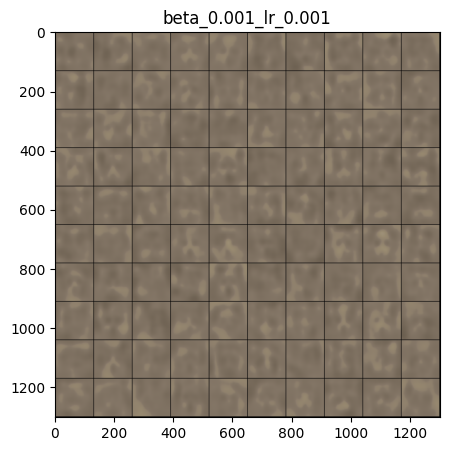

epoch:  10 loss:  0.6033503780973718 loss_rec:  0.6022477384577406 loss_kl:  1.1026393162443282


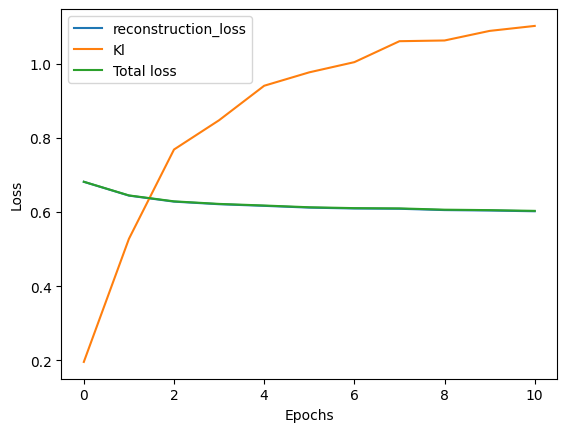

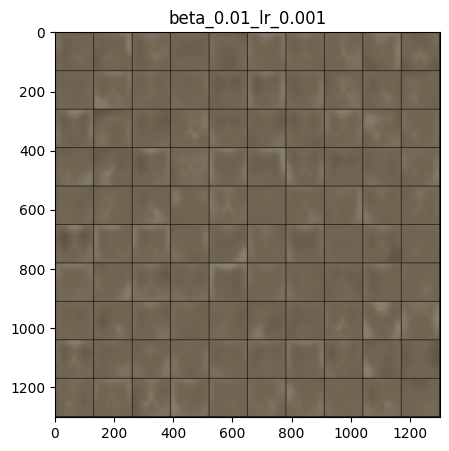

epoch:  10 loss:  0.6254930458170302 loss_rec:  0.6232256344024171 loss_kl:  0.22674106600436758


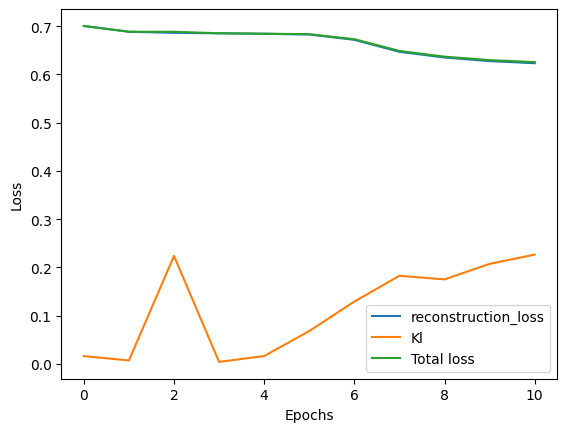

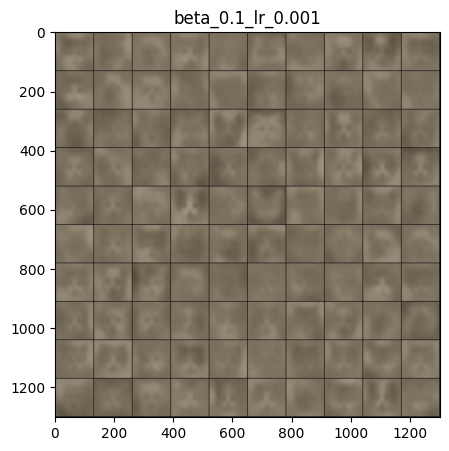

epoch:  10 loss:  0.6295940558961097 loss_rec:  0.6221973090729815 loss_kl:  0.07396746379263858


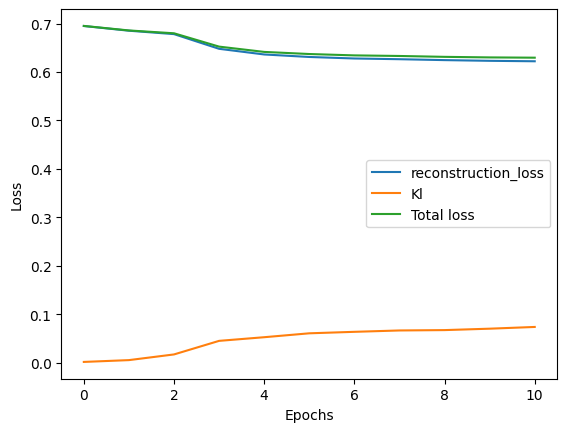

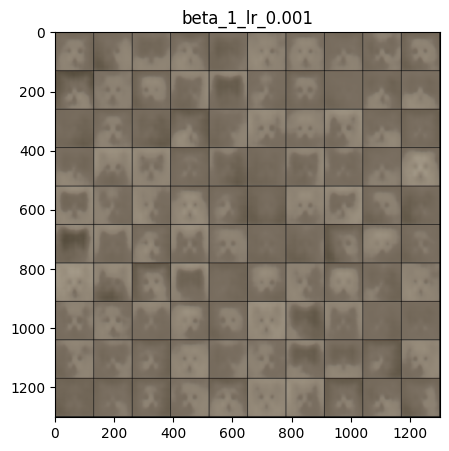

epoch:  10 loss:  0.6590646727288023 loss_rec:  0.6485723599474481 loss_kl:  0.01049231419815345


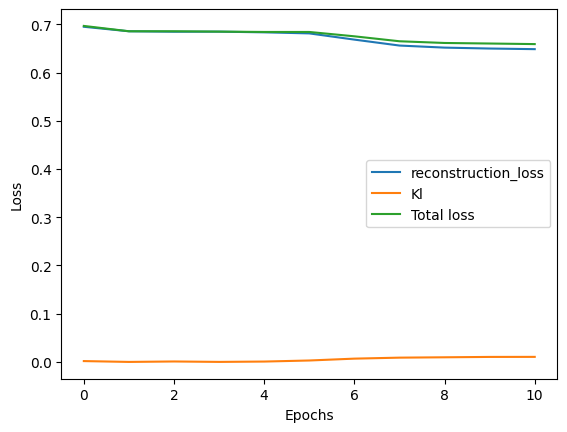

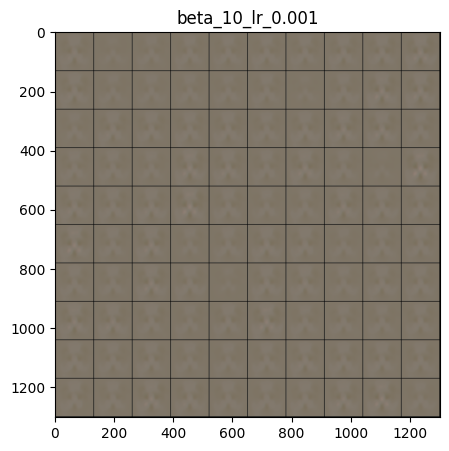

epoch:  10 loss:  0.6843831444040258 loss_rec:  0.6843630443228051 loss_kl:  2.010108285967943e-06


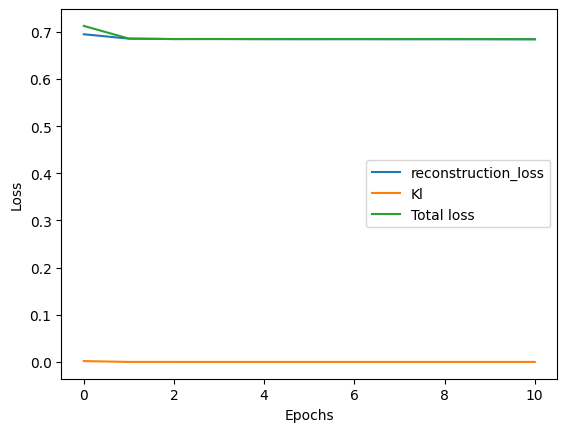

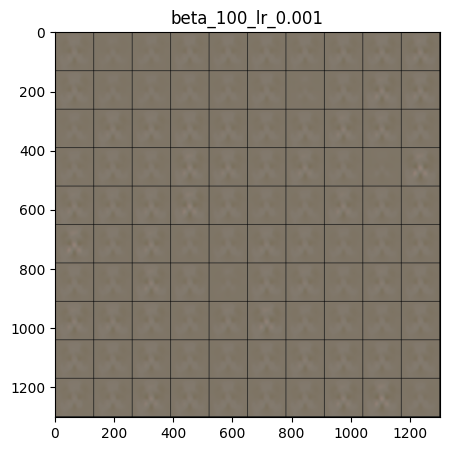

epoch:  10 loss:  0.6845542300254741 loss_rec:  0.6843690865851463 loss_kl:  1.8514607397283977e-06


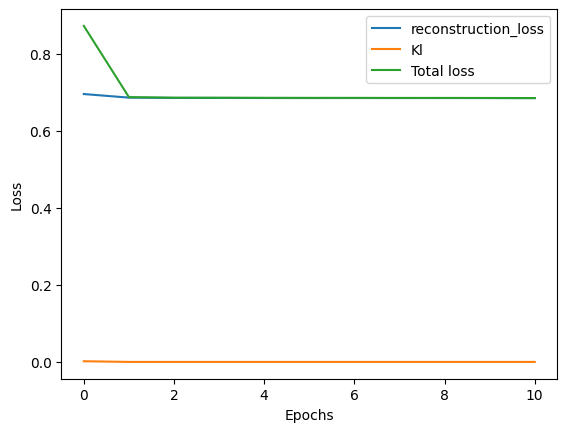

In [ ]:

lr = (1e-3)
betas  = [0.001, 0.01,0.1,1,10,100]

for beta in betas:
    train_beta_vae(beta, lr,
                   epochs= 11,
                   dataloader=dataloaders['val'])
    

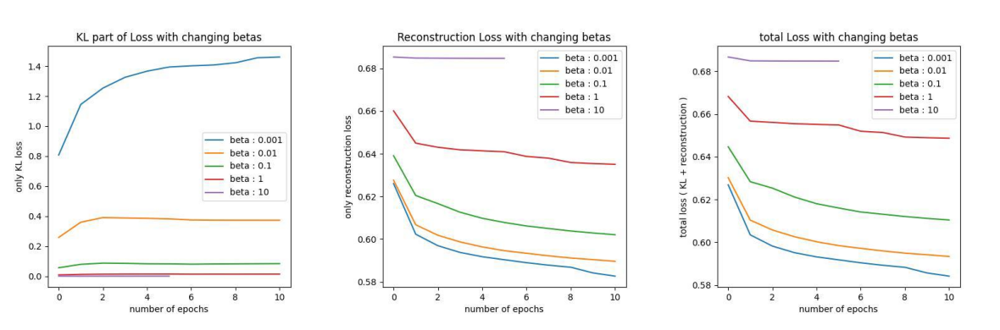

In [11]:
""" 
I stored these loss values in tensorboard. so, here I am directly showing the stored result plot.
"""
# import matplotlib.image as mpimg

# image_paths = ["assets/kl.jpg","assets/rec.jpg", "assets/total.jpg"]

# fig, axs = plt.subplots(1, 3, figsize=(12, 4))  
# for i, image_path in enumerate(image_paths):
#     img = mpimg.imread(image_path) 
#     axs[i].imshow(img)
#     axs[i].axis('off')  
# plt.tight_layout()
# plt.show()


**OBSERVATIONS:** 
* with beta = 0.001: reconstruction error is going very low. But, the KL-Loss is relatively larger.\
the Sampling Quality is relatively poor. But reconstruction is better.
* with increasing beta values, the KL-loss is getting smaller for comparision at same epoch count.  
  
* at **beta = 100(very high)**:  
I Observed something interesting. the sampling is giving same image for all values of the latent "z". I think it's because for very large beta values Reconstruction loss is ignored. so, the Decoder may ignores the latents. and Only encoder focuses on taking posteriors close to standard normal.  
  
<!-- <img src="assets/image_high_beta.jpeg" width=300> -->

* i checked the posterior distributions, all of those are very close to $N(0,1)$.



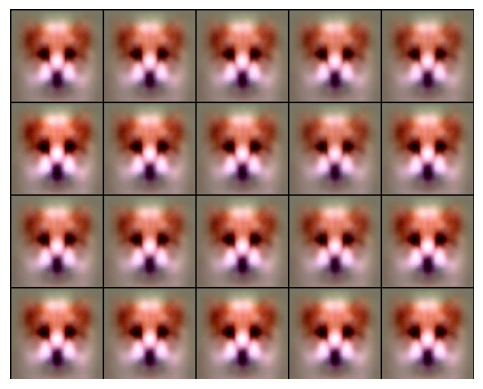

In [16]:
"""this is the result for above observation for very high beta case."""
# x = plt.imread("assets/image_high_beta.jpeg")
# plt.imshow(x)
# plt.axis("off")
# plt.show()

**Color Reconstruction with changing Beta**  
for smaller values of beta, the Reconstruction is good as expected. and color reconstruction is obtained with smaller betas.   
but for larger $\beta$ values, for same number of epochs, mostly the images are looking close to grey.

## Interpolation

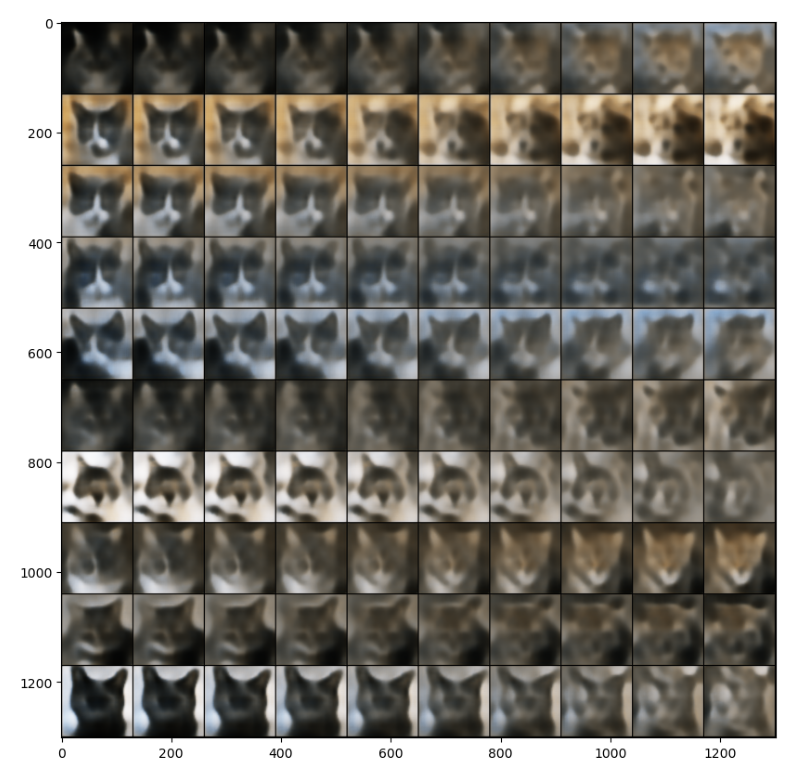

In [7]:
#NOTE: to Run this cell, we must run above training loops for this particular beta,lr 
checkpoint = 'checkpoints/beta_0.001_lr_0.001/epoch_epoch_10_BCE.pth'  # "checkpoints/checkpoint_beta_0.001_lr_0.001_epoch_10.pth"

a = interpolate(model = None,
                   checkpoint = checkpoint,
                   device=None, n=10,
                   trainset = datasets_['train'],
                   valset = datasets_['val'],
                     )


Here,I interpolated between 10 latents that are obtained by the posterior inference on training samples. ( I picked the means of the posterior distributions.) 
A clear symantically interpolated intermediate image are obtained.

## Extra experiments 

### MSE vs BCE


* different loss functions: **BCE vs MSE** 

here i am experimented with $\beta = 0.001$ & $lr = 1e-3$


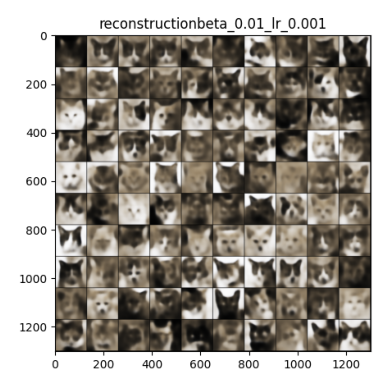

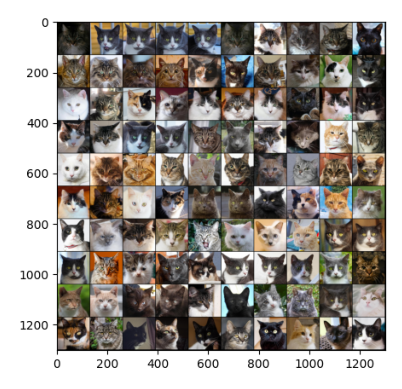

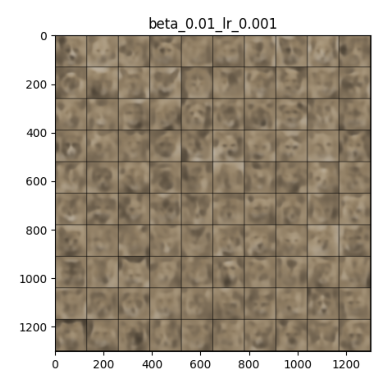

epoch:  9 loss:  0.594305638928231 loss_rec:  0.5905306879288512 loss_kl:  0.37749511677710734


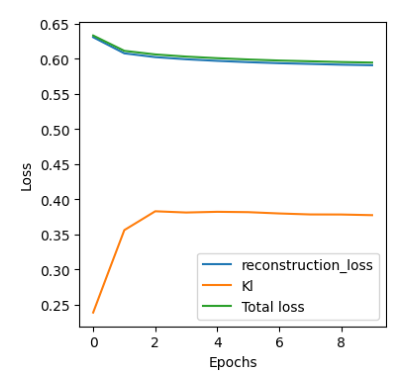

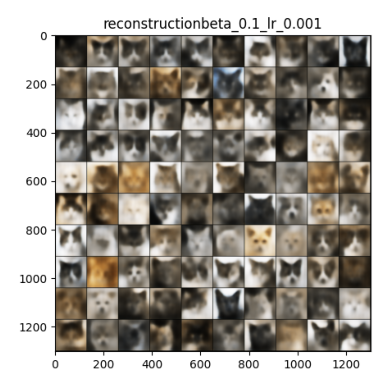

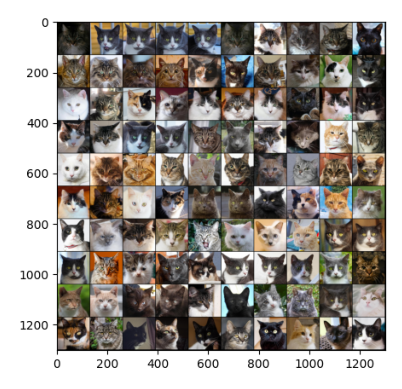

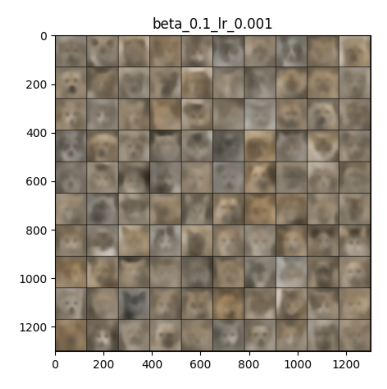

epoch:  9 loss:  0.6097213822635796 loss_rec:  0.6011121616337469 loss_kl:  0.08609220797572631


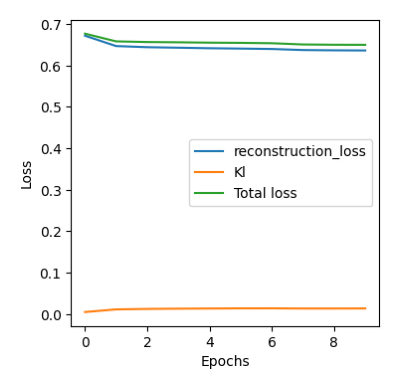

In [35]:
# beta = 0.001
lr = 0.001
for beta in [0.001,0.01]:#[0.001,0.01,0.1,1,10]:
    train_beta_vae(beta, lr,
                epochs = 10,
                dataloader = dataloaders['train'],
                loss_type = "MSE")

**MSE gives color images better than BCE**  
* from our experiments, it is observed that MSE loss is giving more sharper  reconstructions.   
* and for same value of beta, MSE seems to have better sampling and reconstruction.  
* beta = 0.1 is the optimal choice of beta for latent dimension of 512 with "MSE" loss.

### changing Latent dimensions

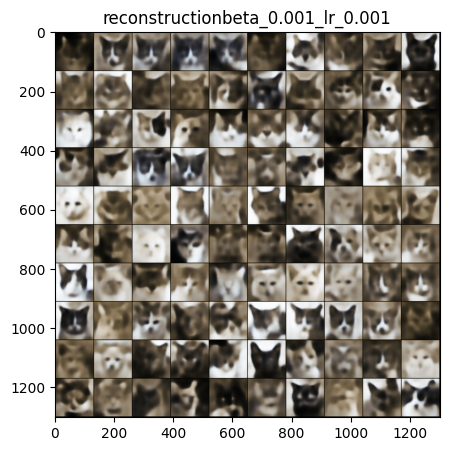

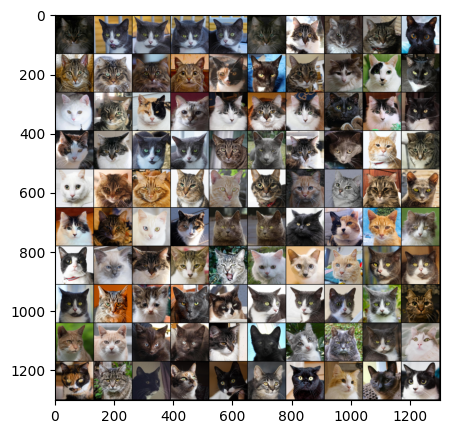

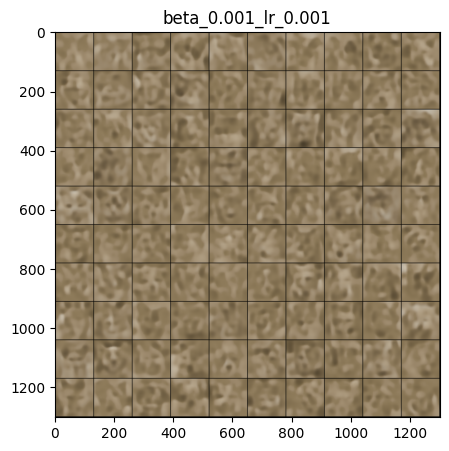

epoch:  9 loss:  0.5884733046990275 loss_rec:  0.5863534365195394 loss_kl:  2.119867925305184


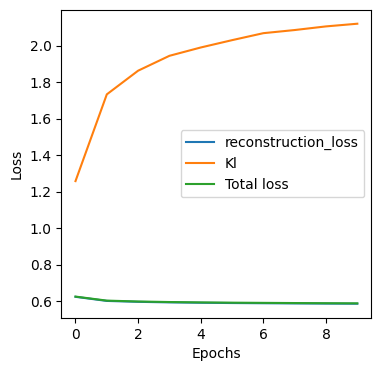

In [13]:
device = "cuda" if torch.cuda.is_available() else 'cpu'
model = BetaVAE(z_dim=128).to(device)
beta = 0.001
lr = 0.001
train_beta_vae(beta, lr,
            epochs = 10,
            model = model,
            dataloader = dataloaders['train'],
            loss_type = "MSE")

In [ ]:
device = "cuda" if torch.cuda.is_available() else 'cpu'
model = BetaVAE(z_dim=128).to(device)
beta = 0.001
lr = 0.001
train_beta_vae(beta, lr,
            epochs = 10,
            model = model,
            dataloader = dataloaders['train'],
            loss_type = "MSE")

# Problem 4

Implement a vanilla Auto-encoder with MSE loss. Perform posterior inference on all the images, post-training. Build a classifier with these latent vectors and calculate the accuracy. Compare it with the latents in problem 2. Fit a GMM on the vectors from the latent space obtained via posterior inference. Subsequently, sample new latents from the GMM, pass it through the decoder, and plot a grid of 10 by 10 images, comparing them with the GMM.

## Libraries

In [31]:
import numpy as np
import math
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torchvision import datasets,transforms
from torch.distributions import Categorical, MultivariateNormal

import torch.nn.functional as F
from tqdm.notebook import tqdm
torch.manual_seed(1234)
np.random.seed(1234)



## Model AE

View

In [32]:
class View(nn.Module):
    def __init__(self, size):
        super(View, self).__init__()
        self.size = size

    def forward(self, tensor):
        return tensor.view(self.size)

Encoder

In [33]:
# encoder
class Encoder(nn.Module):
    def __init__(self, nc=3,z_dim=512):
        super().__init__()
        self.nc = nc
        self.z_dim = z_dim

        channels = [ 3,16,32,64,128,256,512,z_dim] # final shape B, z_dim, 1,1

        layers = []
        
        default_activation = nn.LeakyReLU(0.2, inplace=True)
        
        for i in range(len(channels)-1):
            layers.append(nn.Conv2d(channels[i], channels[i+1], 3, 2, 1))
            activation = default_activation if i < len(channels)-2 else nn.Identity() # not using activation for last layer
            layers.append(activation)
        layers.append (View((-1, z_dim)))


        self.encoder = nn.Sequential(*layers)

    def forward(self, x):
        x = self.encoder(x)
        return x # mu, logvar

Decoder

In [34]:
# decoder
class Decoder(nn.Module):
    def __init__(self, nc=3,z_dim=512):
        super().__init__()
        self.nc = nc
        self.z_dim = z_dim

        defualt_activation = nn.LeakyReLU(0.2, inplace=True)

        self.decoder = nn.Sequential(
                nn.Linear(z_dim, 256),               # B, 256
                View((-1, 256, 1, 1)),               # B, 256,  1,  1
                defualt_activation,
                nn.ConvTranspose2d(256, 64, 4),      # B,  64,  4,  4
                defualt_activation,
                nn.ConvTranspose2d(64, 64, 4, 2, 1), # B,  64,  8,  8
                defualt_activation,
                nn.ConvTranspose2d(64, 32, 4, 2, 1), # B,  32, 16, 16
                defualt_activation,
                nn.ConvTranspose2d(32, 32, 4, 2, 1), # B,  32, 32, 32
                defualt_activation,
                nn.ConvTranspose2d(32, 32, 3, 1, 1), # B,  32, 32, 32
                defualt_activation,
                nn.ConvTranspose2d(32, 2* nc, 4, 2, 1),  # B, 2*nc, 64, 64
                defualt_activation,
                nn.ConvTranspose2d(2*nc, 2*nc,3, 1, 1),  # B, 2*nc, 64, 64
                defualt_activation,
                nn.ConvTranspose2d(2*nc, nc, 4, 2, 1),  # B, nc, 128, 128
                defualt_activation,
                nn.ConvTranspose2d(nc, nc, 3, 1, 1),  # B, nc, 128, 128
                defualt_activation,
                nn.ConvTranspose2d(nc, nc, 3, 1, 1),  # B, nc, 128, 128
            
            )
        
    def forward(self, z):
        x_rec = self.decoder(z)
        # use sigmoid for BCELoss
        x_rec = F.sigmoid(x_rec)
        return x_rec


Auto Encoder

In [35]:
class AE(nn.Module):
    def __init__(self, z_dim=512, nc=3):
        super().__init__()
        self.z_dim = z_dim
        self.nc = nc
        self.encoder = Encoder(nc,z_dim)
        self.decoder = Decoder(nc,z_dim)

        weight_init(self)

    def forward(self, x):
        z = self.encoder(x)
        x_recon = self.decoder(z)
        return x_recon

Weight Initialization

In [36]:
def weight_init(model):
    kaiming_init(model)
    for m in model._modules:
        try:
            weight_init(model._modules[m])
        except:
            print("model init failed for {}".format(m))

def kaiming_init(m):
    if isinstance(m, (nn.Linear, nn.Conv2d)):
        init.kaiming_normal_(m.weight)
        if m.bias is not None:
            m.bias.data.fill_(0)
    elif isinstance(m, (nn.BatchNorm1d, nn.BatchNorm2d)):
        m.weight.data.fill_(1)
        if m.bias is not None:
            m.bias.data.fill_(0)

def normal_init(m, mean, std):
    if isinstance(m, (nn.Linear, nn.Conv2d)):
        m.weight.data.normal_(mean, std)
        if m.bias.data is not None:
            m.bias.data.zero_()
    elif isinstance(m, (nn.BatchNorm2d, nn.BatchNorm1d)):
        m.weight.data.fill_(1)
        if m.bias.data is not None:
            m.bias.data.zero_()

## Parameters

In [37]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
lr = 1e-3
epochs = 10
batch_size= 64
model = AE().to(device)
print(model)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

model init failed for 0
model init failed for 2
model init failed for 4
model init failed for 6
model init failed for 8
model init failed for 10
model init failed for 12
model init failed for 0
AE(
  (encoder): Encoder(
    (encoder): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
      (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (5): LeakyReLU(negative_slope=0.2, inplace=True)
      (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (9): LeakyReLU(negative_slope=0.2, inplace=True)
      (10): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (11):

## Data Preprocessing

In [38]:
data_dir = 'afhq'
transform = transforms.Compose([transforms.Resize(128),transforms.ToTensor()])
dataset = datasets.ImageFolder(data_dir, transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=False)
images,labels = next(iter(dataloader))

transforming data to 128*128. Considering all images in the data

## Training

In [39]:
Loss = []
for epoch in range(epochs):
    
    counter = 0
    running_loss = 0.0

    loop = tqdm(enumerate(dataloader))
    for i,(x,_) in loop:

        counter += 1
        
        # Forward pass
        x = x.to(device)
        x_reconstructed = model(x)

        # Compute loss 
        reconstruction_loss = loss_fn(x_reconstructed, x)

        # Back Prop
        loss = reconstruction_loss 
        optimizer.zero_grad()
        loss.backward()
        running_loss += loss.item()
        optimizer.step()

    print("epoch: ", epoch, "loss: ", (running_loss)/(counter))
    Loss.append((running_loss)/(counter))
    

0it [00:00, ?it/s]

epoch:  0 loss:  0.04269335363722837


0it [00:00, ?it/s]

epoch:  1 loss:  0.02742847881975617


0it [00:00, ?it/s]

epoch:  2 loss:  0.02390701216995245


0it [00:00, ?it/s]

epoch:  3 loss:  0.02202742005672615


0it [00:00, ?it/s]

epoch:  4 loss:  0.020529982284182617


0it [00:00, ?it/s]

epoch:  5 loss:  0.019374938114829685


0it [00:00, ?it/s]

epoch:  6 loss:  0.018458357621941406


0it [00:00, ?it/s]

epoch:  7 loss:  0.017861841309064697


0it [00:00, ?it/s]

epoch:  8 loss:  0.017274170153196385


0it [00:00, ?it/s]

epoch:  9 loss:  0.016697183674709362


Training Autoencoder with MSE loss function. \
Hyper parameters : \
Batch size : 64 \
learning rate : 1e-3 \
epochs : 10 \
input size : [3,128,128] 

Text(0, 0.5, 'loss')

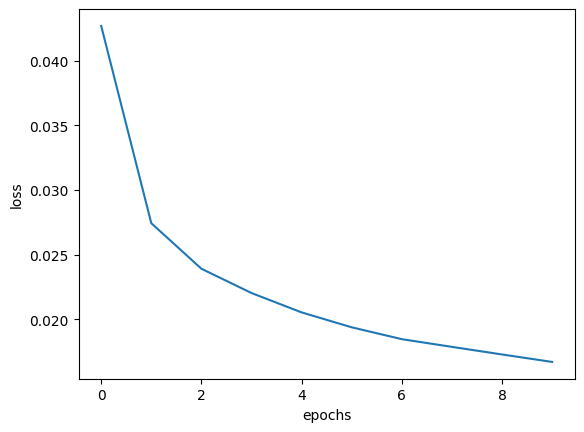

In [40]:
plt.plot(range(epochs), Loss )
plt.xlabel('epochs')
plt.ylabel('loss')

## Posterior inference and classification with latent vectors

In [41]:
data_dir = 'afhq/train'
transform = transforms.Compose([transforms.Resize(128),transforms.ToTensor()])
dataset = datasets.ImageFolder(data_dir, transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=len(dataset), shuffle=False)
images,labels = next(iter(dataloader))

Model 

In [42]:
class Latent_classifier(nn.Module):
    def __init__(self, z_dim=512):
        super().__init__()
        self.hidden1 = nn.Linear(z_dim, 256)
        self.hidden2 = nn.Linear(256, 128)
        self.hidden3 = nn.Linear(128, 64)
        self.hidden4 = nn.Linear(64, 32)
        self.hidden5 = nn.Linear(32, 16)
        self.hidden6 = nn.Linear(16, 3)

    def forward(self, x):
        x = F.leaky_relu(self.hidden1(x))
        x = F.leaky_relu(self.hidden2(x))
        x = F.leaky_relu(self.hidden3(x))
        x = F.leaky_relu(self.hidden4(x))
        x = F.leaky_relu(self.hidden5(x))
        x = F.softmax(self.hidden6(x),dim=1)

        return x

latent_classifier = Latent_classifier().to(device)
print(latent_classifier)
loss_fn_classifier = nn.CrossEntropyLoss()
lr_classifier = 1e-5
cls_optim = torch.optim.Adam(latent_classifier.parameters(), lr=lr_classifier)

latents_of_AE = model.encoder(images.to(device))

batch_size = 64
epochs = 25

dataset_AE = torch.utils.data.TensorDataset(latents_of_AE, labels)
dataloader_AE = torch.utils.data.DataLoader(dataset_AE, batch_size=batch_size, shuffle=False)

Latent_classifier(
  (hidden1): Linear(in_features=512, out_features=256, bias=True)
  (hidden2): Linear(in_features=256, out_features=128, bias=True)
  (hidden3): Linear(in_features=128, out_features=64, bias=True)
  (hidden4): Linear(in_features=64, out_features=32, bias=True)
  (hidden5): Linear(in_features=32, out_features=16, bias=True)
  (hidden6): Linear(in_features=16, out_features=3, bias=True)
)


In [43]:
Loss = []
for epoch in range(epochs):
    
    counter = 0
    running_loss = 0.0

    for i, (x, label) in tqdm(enumerate(dataloader_AE)):
        #print(x)
        # print(label)

        counter += 1
        
        # Forward pass
        _latent = x.to(device)
        _label = label.to(device)
        logit = latent_classifier( _latent)

        # Compute loss 
        loss = loss_fn_classifier(logit, _label)

        if i%100 == 0:
            print(loss.item())
        
        # Back Prop
        cls_optim.zero_grad()
        loss.backward(retain_graph=True)

        running_loss += loss.item()
        cls_optim.step()

    Loss.append((running_loss)/(counter))
    print("epoch: ", epoch, "loss: ", (running_loss)/(counter))


0it [00:00, ?it/s]

1.1053675413131714
1.0779539346694946
1.126807451248169
epoch:  0 loss:  1.0992965286996166


0it [00:00, ?it/s]

1.100422739982605
1.0635026693344116
1.131775140762329
epoch:  1 loss:  1.0947256213192336


0it [00:00, ?it/s]

1.0983349084854126
1.0445199012756348
1.137845754623413
epoch:  2 loss:  1.0885579661510918


0it [00:00, ?it/s]

1.1033422946929932
1.0143370628356934
1.148179292678833
epoch:  3 loss:  1.079642146435367


0it [00:00, ?it/s]

1.112139344215393
0.9671736359596252
1.1620779037475586
epoch:  4 loss:  1.067543228640827


0it [00:00, ?it/s]

1.1199212074279785
0.9085260629653931
1.1753671169281006
epoch:  5 loss:  1.0541128469346392


0it [00:00, ?it/s]

1.1213940382003784
0.8549977540969849
1.184425711631775
epoch:  6 loss:  1.041900050171598


0it [00:00, ?it/s]

1.1173110008239746
0.8151006698608398
1.1894797086715698
epoch:  7 loss:  1.0318461253132882


0it [00:00, ?it/s]

1.1092970371246338
0.7879729866981506
1.1912336349487305
epoch:  8 loss:  1.0232425233162126


0it [00:00, ?it/s]

1.0988011360168457
0.7701817750930786
1.1903671026229858
epoch:  9 loss:  1.0153803278785605


0it [00:00, ?it/s]

1.0853514671325684
0.7589443325996399
1.1869230270385742
epoch:  10 loss:  1.0075784062714557


0it [00:00, ?it/s]

1.0696790218353271
0.7524539828300476
1.181411862373352
epoch:  11 loss:  0.9994710681219809


0it [00:00, ?it/s]

1.0503188371658325
0.7510140538215637
1.1738367080688477
epoch:  12 loss:  0.9903684594225155


0it [00:00, ?it/s]

1.0173991918563843
0.7595321536064148
1.163415789604187
epoch:  13 loss:  0.9766490446428024


0it [00:00, ?it/s]

0.9628684520721436
0.7686610221862793
1.152789831161499
epoch:  14 loss:  0.958534855509429


0it [00:00, ?it/s]

0.9090020060539246
0.7737505435943604
1.1409331560134888
epoch:  15 loss:  0.9418170983093794


0it [00:00, ?it/s]

0.8695958256721497
0.7769899964332581
1.1268365383148193
epoch:  16 loss:  0.9276298526593171


0it [00:00, ?it/s]

0.840531051158905
0.7797597050666809
1.1118106842041016
epoch:  17 loss:  0.9157641350442145


0it [00:00, ?it/s]

0.818929135799408
0.7822437286376953
1.0959715843200684
epoch:  18 loss:  0.9055705937235636


0it [00:00, ?it/s]

0.8025909662246704
0.7848756313323975
1.0803911685943604
epoch:  19 loss:  0.8968181243109391


0it [00:00, ?it/s]

0.7894660830497742
0.7871274948120117
1.0648994445800781
epoch:  20 loss:  0.8890963311278663


0it [00:00, ?it/s]

0.7790465950965881
0.7894003987312317
1.0503880977630615
epoch:  21 loss:  0.882283729757284


0it [00:00, ?it/s]

0.7703983783721924
0.7912921905517578
1.037055253982544
epoch:  22 loss:  0.8761862602296354


0it [00:00, ?it/s]

0.7632447481155396
0.7929152250289917
1.0245922803878784
epoch:  23 loss:  0.8706317648096377


0it [00:00, ?it/s]

0.7574968338012695
0.7946243286132812
1.013318657875061
epoch:  24 loss:  0.8657058779329192


In [44]:
def calculate_accuracy(model, dataloader):
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            # labels_out = torch.argmax(labels, dim=1)
            # labels_out = labels_out.to(device)
            total += labels.size(0)
            correct += (predicted == labels.to(device)).sum()

    accuracy = (100*correct)/total

    return accuracy

In [45]:
accuracy_AE_latents = calculate_accuracy(latent_classifier, dataloader_AE)
print(accuracy_AE_latents)

tensor(71.5858, device='cuda:0')


Accuracy with latent vectors from VAE : 81.23 \
Accuracy with latent vectors from AE : 72.4744

## GMM on the vectors from the latent space

In [46]:
class log_resp(nn.Module):
    
    def __init__(self, X):
        super(log_resp, self).__init__()
        self.X         = X
        self.N, self.D = X.shape                                   # N : Number of data points, D : Dimension of data points

    def forward(self, Alpha, Mean, pre_cov):
                                       
        log_alpha = torch.log(Alpha)

        precisions = pre_cov**2
        log_prob = (                                               # Calculation of log of exponent in Gaussian multivarient distribution
            torch.sum((Mean**2 * precisions), 1)
            - 2.0 * torch.mm(self.X, (Mean * precisions).T)
            + torch.mm(self.X**2, precisions.T)
        )

        log_prob_gau = -0.5 * (self.D * torch.log(torch.tensor(2 * math.pi)) + log_prob) + torch.sum(torch.log(pre_cov), dim=1) # log value of comple gaussian distribution

        weig_log_prob = log_alpha + log_prob_gau                   # log of responsibility

        return  weig_log_prob
 


In [47]:
gamma_AE = log_resp(latents_of_AE)
gamma_AE.to(device)
print("GPU Device Name:", torch.cuda.get_device_name(0))


GPU Device Name: NVIDIA RTX A6000


Initializing GMM parameters

In [48]:
num_of_components = 100
latent_GMM_dim = 512
Mean  = torch.rand([num_of_components, latent_GMM_dim], device=device)
Cov   = torch.rand([num_of_components, latent_GMM_dim], device=device)
Alpha = torch.full((num_of_components,), 1/num_of_components, device=device)

pre_cov = 1/torch.sqrt(Cov)
iterations = 100

Training GMM

In [49]:
Tot_log_likelihood = []

for i in range(iterations):

    # Calculating weight log responsibility using EM
    weig_log_prob = gamma_AE(Alpha, Mean, pre_cov)

    log_resp = weig_log_prob - torch.logsumexp(weig_log_prob, dim =1)[:, None] 
    
    # Calculating actual responsibility
    resp = torch.exp(log_resp)

    nk = torch.sum(resp, dim=0) + torch.finfo(resp.dtype).eps

    # M- Step

    # Calculate New Mean
    Mean_New = torch.mm(resp.T,latents_of_AE)/(nk[:,None])
    avg_X2 = torch.mm(resp.T, latents_of_AE * latents_of_AE) / nk[:, None]
    avg_means2 = Mean_New**2
    avg_X_means = Mean_New * torch.mm(resp.T, latents_of_AE) / nk[:, np.newaxis]

    # Calculating New Covarience
    Cov_New = avg_X2 - 2 * avg_X_means + avg_means2 + 1e-6

    # Calculating New Alpha
    Alpha_New = (resp.sum(dim=0))/(latents_of_AE.shape[0])

    Mean = Mean_New
    Cov  = Cov_New
    Alpha = Alpha_New

    pre_cov = 1/torch.sqrt(Cov)

    # Calculating likelihood
    log_likelihood = torch.sum(torch.logsumexp(weig_log_prob, dim=1))
    Tot_log_likelihood.append(log_likelihood.to('cpu'))

In [50]:
Mean_latent_GMM = Mean
Cov_latent_GMM = Cov
Alpha_latent_GMM = Alpha

Sampling from GMM

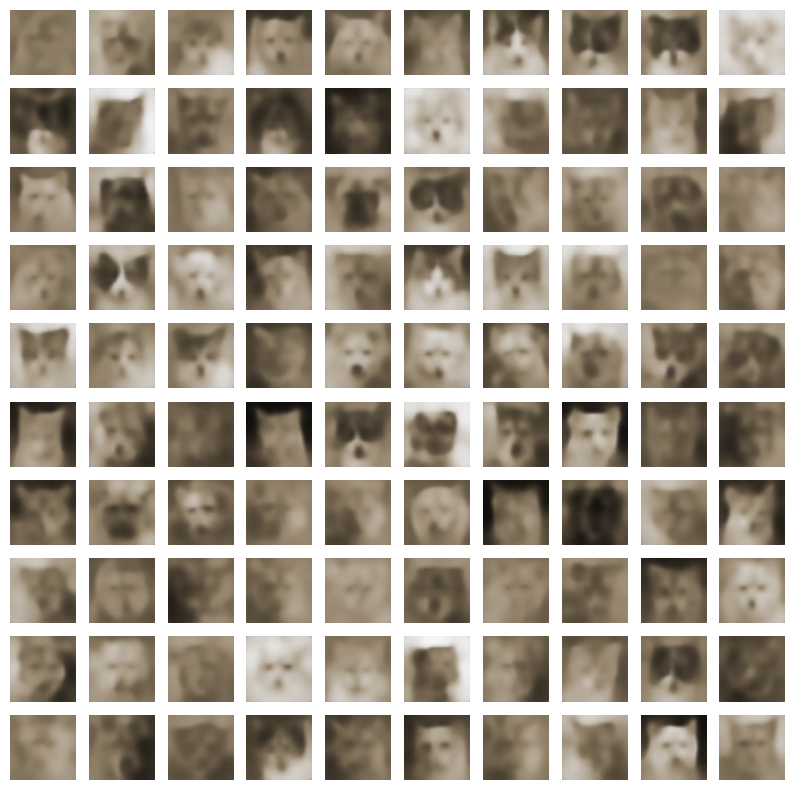

In [51]:
fig, axs = plt.subplots(10, 10, figsize=(10, 10))

 

# Iterate through each subplot and assign a value
for i in range(10):
    for j in range(10):
        component_distribution = Categorical(Alpha_latent_GMM)

        component_index = component_distribution.sample()

        selected_mean = Mean_latent_GMM[component_index,:]
        selected_covarience = Cov_latent_GMM[component_index]

        selected_distribution = MultivariateNormal(selected_mean, torch.diag(selected_covarience))

        sampled_data_point = selected_distribution.sample()

        sampled_data_point_decoder = model.decoder(sampled_data_point.reshape(sampled_data_point.shape))

        image_sampled_data_point = sampled_data_point_decoder.squeeze().permute(1, 2, 0)

        image_sampled_data_point = image_sampled_data_point.to('cpu').detach().numpy()
        
        axs[i, j].imshow(image_sampled_data_point)  # Replace with your image data
        axs[i, j].axis('off')  # Turn off axis labels

 

plt.show()